# Deep Pursuit of Perceptually Uniform Colour Space

Our colour perception diverges from objective photometric measurements in several aspects. One
prominent example is the colour difference between two surfaces. Despite numerous attempts, no
colour spaces are genuinely perceptually uniform, i.e., a perfect match between the spatial
distance of two colours and the perceived colour difference. Here, we put forward a novel
approach by utilising deep neural networks (DNNs) to tackle this challenge. We train a linear
classifier on top of frozen pretrained networks to perform a colour discrimination odd-one-out
task. Next, we measure the networks' sensitivity threshold for several RGB points in multiple
directions. The pattern of networks' discrimination thresholds highly resembles human
sensitivity, e.g., higher sensitivity to hue than chroma. Next, we train a shallow neural network
to transfer the RGB space into a new space with a homogenous Euclidean distance for all measured
sensitivity thresholds. Our evaluation of this deep colour space on several human data suggests
this framework can potentially lead us to find a perceptually uniform colour space.

## Source code

The source code to train and test networks is publicly available on our
GitHub repository [DeepTHS](https://github.com/ArashAkbarinia/DeepTHS).

The experimental materials are also publicly available upon request. Due
to a large number of files (3490 for one layer, 20940 for one network), 
they are not uploaded to GitHub.

### Importing packages

The following packages are required to execute this notebook.

In [1]:
import numpy as np
import pandas as pd
import glob
import os
import json

import torch
import torch.nn as nn

import cv2
from skimage import io as skiio
from skimage import color as skicolour
from scipy import stats
import colour as colour_science
from sklearn.metrics import ConfusionMatrixDisplay
from scipy.optimize import minimize
from matplotlib import pyplot as plt
from matplotlib.patches import Ellipse as plt_ellipse
import seaborn as sns

from IPython.display import display, Image

### Utility functions

Below is a list of functions that help us to report this project.

In [2]:
fig_out_dir = '../presentations/DeepPursueOfPerceptuallyUniformColourSpace/'
# D65
illuminant = np.array([0.31271, 0.32902])

In [143]:
all_spaces_predictions = predict_human_uniformity()

#### Plotting

In [140]:
def plot_colour_space_predictions():
    all_spaces_predictions = predict_human_uniformity()
    space_names = list(all_spaces_predictions.keys())
    space_names[-1] = '$\Delta E2000$'
    metrics = all_spaces_predictions['rgb'].keys()
    titles = [
        'MacAdam Ellipses',
        'Luo-Rigg Ellipses',
        'MacAdam 1974'
    ]
    palette = sns.color_palette()[:5]
    fig = plt.figure(figsize=(16, 4))
    for metric_ind, metric in enumerate(metrics):
        ax = fig.add_subplot(1, 3, metric_ind + 1)
        if metric_ind != 2:
            ax.ticklabel_format(style='scientific', axis='both', scilimits=(0, 0))
        toplot = [val[metric][1] for val in all_spaces_predictions.values()]
        sns.barplot(x=space_names, y=toplot, hue=space_names, ax=ax, 
                    palette=palette, legend=False)
        ax.set_xticks(np.arange(len(space_names)))
        ax.set_xticklabels(space_names, fontsize=14)
        ax.set_title(titles[metric_ind], fontsize=18, fontweight='bold')
        
        if metric_ind == 0:
            ax.set_ylabel('$\sigma$ Normalised Distance', fontsize=18)
        if metric_ind == 2:
            ax.set_ylabel('$r$ Pearson Correlation', fontsize=18)
    return fig


def draw_neural_net(layer_sizes, left=0.1, right=0.9, bottom=0.1, top=0.9):
    fig = plt.figure(figsize=(12, 4))
    ax = fig.add_subplot(1, 1, 1)
    n_layers = len(layer_sizes)
    v_spacing = (top - bottom)/float(max(layer_sizes))
    h_spacing = (right - left)/float(n_layers - 1)
    # Nodes
    labels = {'orange': 'Input', 'red': 'Output', 'white': 'Hidden'}
    for n, layer_size in enumerate(layer_sizes):
        layer_top = v_spacing * (layer_size - 1) / 2. + (top + bottom) / 2.
        for m in range(layer_size):
            center = (n * h_spacing + left, layer_top - m * v_spacing)
            radius = min(v_spacing, h_spacing) * 200
            if n == 0:
                facecolor = 'orange'
            elif n == (n_layers -1):
                facecolor = 'red'
            else:
                facecolor = 'white'
            ax.plot(center[0], center[1], 'o', color='black', markerfacecolor=facecolor, 
                    markersize=radius, label=labels[facecolor])
            labels[facecolor] = None

    # Edges
    for n, (layer_size_a, layer_size_b) in enumerate(zip(layer_sizes[:-1], layer_sizes[1:])):
        layer_top_a = v_spacing*(layer_size_a - 1)/2. + (top + bottom)/2.
        layer_top_b = v_spacing*(layer_size_b - 1)/2. + (top + bottom)/2.
        for m in range(layer_size_a):
            for o in range(layer_size_b):
                line = plt.Line2D(
                    [n*h_spacing + left, (n + 1)*h_spacing + left],
                    [layer_top_a - m*v_spacing, layer_top_b - o*v_spacing], 
                    c='gray', alpha=0.5
                )
                ax.add_artist(line)
    ax.legend(fontsize=10, ncol=3, title="Layer Type", title_fontproperties={'size':10})
    ax.axis('off')
    return fig


def plot_stds_layers_metrics(net_colour_diff, title=None):
    space_metric_names = list(net_colour_diff[list(net_colour_diff.keys())[0]].keys())
    fig = plt.figure(figsize=(14, 14))
    for metric_ind, metric_name in enumerate(space_metric_names):
        layers_res = np.array([layer_full_res[metric_name] for layer_full_res in net_colour_diff.values()])
        ax = fig.add_subplot(3, 2, metric_ind+1)
        sns.violinplot(data=layers_res.T, ax=ax)
        ax.set_title("$\Delta E2000$" if metric_name == 'de2000' else metric_name, fontsize=20)
        ax.set_xticks(np.arange(6))
        ax.set_xticklabels(net_colour_diff.keys())
        ax.set_ylabel('Distance', fontsize=20)
        for i in range(layers_res.shape[0]):
            ax.text(i+0.1, layers_res.max() * 0.7, "$\sigma$=%.3f" % np.std(layers_res[i]), 
                    rotation='vertical', fontsize=18)
    if title is not None:
        fig.suptitle(title, fontsize=20, fontweight='bold')
    fig.tight_layout()
    return fig


def plot_colour_diff_dist(area_res):
    palette = sns.color_palette()[:5]
    area_res_array = np.array(list(area_res.values()))
    fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(8, 4), gridspec_kw={'width_ratios': [4, 1]})
    sns.violinplot(data=area_res_array[:4].T, ax=ax0)
    sns.violinplot(data=area_res_array[4].T, ax=ax1, color=palette[-1])
    for i in range(4):
        ax0.text(i+0.1, 0.3, "$\sigma$=%.3f" % np.std(area_res_array[i]), rotation='vertical', fontsize=18)
    ax1.text(0.1, 15, "$\sigma$=%.3f" % np.std(area_res_array[-1]), rotation='vertical', fontsize=18)
    
    ax0.set_ylabel('Distance', fontsize=18)
    ax0.set_xticks(np.arange(4))
    ax0.set_xticklabels(list(area_res.keys())[:4], fontsize=18)
    ax0.set_xlim([-0.5, 3.5])
    ax1.set_xticks([0])
    ax1.set_xticklabels(['$\Delta E2000$'], fontsize=18)
    ax1.set_xlim([-0.5, 0.5])
    return fig


def plot_std_explain(area_res):
    euc_dis_pts = euc_distance(area_res['hot_cen'], area_res['hot_bor'])
    num_tests = area_res['hot_cen'].shape[0]
    fig = plt.figure(figsize=(8, 4))
    ax = fig.add_subplot(1, 1, 1)
    for i in range(0, num_tests, num_tests//20):
        ax.plot(i, 0, 'v', color=area_res['hot_cen'][i], markersize=10)
        ax.plot(i, euc_dis_pts[i], '^', color=area_res['hot_cen'][i], markersize=10)
        ax.plot([i, i], [0, euc_dis_pts[i]], '-', color=area_res['hot_cen'][i], linewidth=4)
    ax.set_xlabel('Trial', fontsize=18)
    ax.set_ylabel('Euclidean distance', fontsize=18)
    ax.set_xticklabels([])
    ax.set_xticks([])
    ax.set_title('Variation in Sensitivity Thresholds', fontsize=18)
    return fig


def plot_test_direction(rgb_test_data, pt_ind):
    ex_pt = rgb_test_data[pt_ind]
    rgb_dir_pts = [ex_pt['ref'], *[test_colour for test_colour in ex_pt['ext']]]
    rgb_dir_pts = np.expand_dims(np.array(rgb_dir_pts), axis=1)
    fig = plot_colour_pts(rgb_dir_pts, rgb_dir_pts, 'Test Directions', figsize=(5, 4),
                          axis_names=rgb_axs_name, axs_range=rgb_axs_range, whichd='3d')
    ax = fig.axes[0]
    for test_colour in ex_pt['ext']:
        x, y, z = ex_pt['ref']
        tx, ty, tz = test_colour
        ax.quiver(x, y, z, tx-x, ty-y, tz-z, arrow_length_ratio=0.05, alpha=0.3, color='black')
    return fig


def plot_staircase(area_dir, test_item):
    fig = plt.figure(figsize=(8, 3))
    ax = fig.add_subplot(1, 1, 1)
    rgb_test_data = read_test_pts('../data/test_pts/rgb_points.csv')
    sample_file = '%sevolution_%s.csv' % (area_dir, test_item)
    sample_data = np.loadtxt(sample_file, delimiter=',')
    f_m_inds = test_item.split('_')
    fixed_colour = rgb_test_data[f_m_inds[0]]['ref']
    adjusted_colour = rgb_test_data[f_m_inds[0]]['ext'][int(f_m_inds[1])]
    margin = 0.3
    ax.plot(0, 1, '<', color=fixed_colour, label='Fixed Colour')
    ax.plot(margin, 1, '>', color=adjusted_colour, label='Adjusted Colour')
    for i in range(sample_data.shape[0]):
        ax.plot(i+1, sample_data[i][0], '<', color=fixed_colour)
        ax.plot(i+1+margin, sample_data[i][0], '>', color=sample_data[i][1:4])
    ax.legend(fontsize=16)
    ax.set_xlabel('Trial number', fontsize=18)
    ax.set_ylabel('Accuracy (%)', fontsize=18)
    ax.set_title('Staircase Procedure', fontsize=18)
    return fig


def plot_rgb_corners(ax=None):
    points = sample_rgb(8)
    if ax is None:
        fig = plt.figure(figsize=(3, 3))
        ax = fig.add_subplot(1, 1, 1, projection='3d')
    fontsize = 18
    for p in points:
        x, y, z = p.squeeze()
        ax.plot([x, x], [y, y], [z, abs(z-1)], 'black')
        ax.plot([x, x], [y, abs(y-1)], [z, z], 'black')
        ax.plot([x, abs(x-1)], [y, y], [z, z], 'black')
    ax = scatter_3D(points, points, ax, ['', '', ''], s_size=200, alpha=1)
    ax.view_init(elev=25, azim=-60, roll=0)
    return ax


def plot_colour_pts(points, colours, title=None, axis_names=None, whichd='all', 
                    projections=None, axs_range=None, figsize=None):
    if whichd == '2d':
        naxis = 3
    elif whichd == '3d':
        naxis = 1
    else:
        naxis = 4
    fig = plt.figure(figsize=(naxis*5 + 5, 5) if figsize is None else figsize)

    fontsize = 18 if naxis >= 3 else 12
    axis_names = ['Ax=0', 'Ax=1', 'Ax=2'] if axis_names is None else axis_names
    if axs_range == 'auto':
        min_pts = points.min(axis=(1, 0))
        max_pts = points.max(axis=(1, 0))
        axs_len = max_pts - min_pts
        axs_range = list(zip(-0.05 * abs(axs_len) + min_pts, 0.05 * abs(axs_len) + max_pts))
    if whichd != '2d':
        ax_3d = fig.add_subplot(1, naxis, 1, projection='3d')
        ax_3d = scatter_3D(points, colours, ax_3d, axis_names, fontsize, axs_range,
                           labelpad=-5 if naxis == 1 else 0)
    if whichd != '3d':
        if projections is None:
            projections = [None] * 3
        axs_2d = [fig.add_subplot(
            1, naxis, chn, projection=projections[chn-2]
        ) for chn in range(naxis-2, naxis+1)]
        axs_2d = scatter_2D(points, colours, axs_2d, axis_names, fontsize, axs_range)
    if title is not None:
        fig.suptitle(title, fontsize=int(fontsize*1.5))
    return fig


def scatter_3D(points, colours, ax, axis_names, fontsize=14, axs_range=None,
               s_size=64, alpha=None, labelpad=0):
    """Plotting the points in a 3D space."""
    if axis_names[0] == 'H':
        org_points = points.copy()
        points = points.copy()
        points[..., 0] = org_points[..., 1] * np.cos(org_points[..., 0])
        points[..., 1] = org_points[..., 1] * np.sin(org_points[..., 0])

    ax.scatter(points[..., 0], points[..., 1], points[..., 2], 
               c=colours, marker='o', edgecolors='gray', s=s_size, alpha=alpha)
    ax.set_xlabel(axis_names[0], fontsize=fontsize, rotation=-15, labelpad=0)
    ax.set_ylabel(axis_names[1], fontsize=fontsize, rotation=45, labelpad=0)
    ax.set_zlabel(axis_names[2], fontsize=fontsize, rotation=90, labelpad=labelpad)

    if axs_range is None:
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_zticks([])
    else:
        ax.set_xticks(np.around([np.min(points[..., 0]), np.max(points[..., 0])], decimals=1))
        ax.set_yticks(np.around([np.min(points[..., 1]), np.max(points[..., 1])], decimals=1))
        ax.set_zticks(np.around([np.min(points[..., 2]), np.max(points[..., 2])], decimals=1))
        ax.set_xlim(*axs_range[0])
        ax.set_ylim(*axs_range[1])
        ax.set_zlim(*axs_range[2])
    return ax


def scatter_2D(points, colours, axs, axis_names, fontsize=14, axs_range=None):   
    """Plotting three planes of a 3D space."""
    s_size = 10 ** 2

    p1s = [0, 0, 1]
    p2s = [1, 2, 2]
    for ax_ind, ax in enumerate(axs):
        if ax is None:
            continue
        ax.scatter(points[..., p1s[ax_ind]], points[..., p2s[ax_ind]], s=s_size, 
                   marker='o', color=colours, edgecolors='gray')
        ax.set_xlabel(axis_names[p1s[ax_ind]], fontsize=fontsize, loc='center')
        ax.set_ylabel(axis_names[p2s[ax_ind]], fontsize=fontsize, loc='center')

        if axs_range is None:
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_xticks([])
            ax.set_yticks([])
        else:
            ax.set_xticks(np.around([np.min(points[..., p1s[ax_ind]]), np.max(points[..., p1s[ax_ind]])], decimals=1))
            ax.set_yticks(np.around([np.min(points[..., p2s[ax_ind]]), np.max(points[..., p2s[ax_ind]])], decimals=1))
            ax.set_xlim(*axs_range[p1s[ax_ind]])
            ax.set_ylim(*axs_range[p2s[ax_ind]])
    return axs


def show_svg(filename):
    display(Image(url=filename))


def plot_random_shape(colours, figsize=(8, 2)):
    fig = plt.figure(figsize=figsize)
    
    a, b = np.random.uniform(0.5, 1), np.random.uniform(0.5, 1)
    m, n = np.random.uniform(0.3, 3), np.random.uniform(0.3, 3)
    xys = np.array(
        [superellipse(a, b, m, n, phi) for phi in np.arange(0, 2 * np.pi, 0.01)]
    )
    
    for i in range(4):
        ax = fig.add_subplot(1, 4, i+1)
        ax.fill(xys[:, 0], xys[:, 1], color=colours[i])
        ax.axis('equal')
        ax.set_facecolor('grey')
        ax.set_ylim([-1, 1])
        ax.set_xlim([-1, 1])
        ax.set_xticks([])
        ax.set_yticks([])


def plot_de_on_axis(fig, out_de, max_de):
    hdes, vdes, harrows, varrows, plane_pts, ax_ind, gap = out_de
    hdes = (hdes / max_de) * gap
    vdes = (vdes / max_de) * gap
    # plotting the arrows
    ax = fig.axes[ax_ind]
    for i in range(len(hdes)):
        shift = (gap - hdes[i]) * 0.5
        sx = harrows[i][0] + shift
        ax.plot([sx, sx + hdes[i]], [harrows[i][1]]*2, color='gray')
    for i in range(len(vdes)):
        shift = (gap - vdes[i]) * 0.5
        sy = varrows[i][1] + shift
        ax.plot([varrows[i][0]]*2, [sy, sy + vdes[i]], color='gray')
    return


def plot_de2000(rgb_pts, plane_numbers, title=None, diff_fun='de2000', axis_names=None,
                only_planes=False, **kwargs):
    out_t = neighbour_diff(rgb_pts, 'transverse', plane_numbers[0], diff_fun)
    out_s = neighbour_diff(rgb_pts, 'sagittal', plane_numbers[1], diff_fun)
    out_c = neighbour_diff(rgb_pts, 'coronal', plane_numbers[2], diff_fun)
    # MAX_DE = 25.05
    if diff_fun == 'euc':
        max_de = 1
    else:
        max_de = np.max(np.concatenate([out_t[0], out_t[1], out_s[0], out_s[1], out_c[0], out_c[1]]))
    # plotting    
    all_planes = np.concatenate([out_t[4], out_s[4], out_c[4]])

    naxis = 4
    fig = plt.figure(figsize=(naxis*5 + 5, 5))

    fontsize = 18
    axis_names = ['Ax=0', 'Ax=1', 'Ax=1'] if axis_names is None else axis_names
    # plotting 3D
    ax_3d = fig.add_subplot(1, naxis, 1, projection='3d')
    ax_3d = scatter_3D(all_planes, all_planes, ax_3d, axis_names, fontsize, **kwargs)
    # plotting 2Ds
    axs_2d = [fig.add_subplot(1, naxis, chn) for chn in range(naxis-2, naxis+1)]
    _ = scatter_2D(out_t[4], out_t[4], [axs_2d[0], None, None], axis_names, fontsize, **kwargs)
    _ = scatter_2D(out_s[4], out_s[4], [None, axs_2d[1], None], axis_names, fontsize, **kwargs)
    _ = scatter_2D(out_c[4], out_c[4], [None, None, axs_2d[2]], axis_names, fontsize, **kwargs)
    if only_planes is False:
        plot_de_on_axis(fig, out_t, max_de)
        plot_de_on_axis(fig, out_s, max_de)
        plot_de_on_axis(fig, out_c, max_de)
    if title is not None:
        fig.suptitle(title, fontsize=int(fontsize*1.5))
    return fig


def draw_ellipse(ax, ellipse):
    x, y, a, b, theta = ellipse
    ellipse = plt_ellipse(
        (x, y),  # Center coordinates
        a, b,  # Major and minor axes
        angle=theta,  # Orientation angle in degrees
        fill=False,  # Don't fill the ellipse
        edgecolor='black',  # Color of the ellipse outline
        linewidth=1  # Line width of the ellipse outline
    )
    ax.add_patch(ellipse)


def chromaticity_diagram(title, figsize=4.5):
    fig, ax = colour_science.plotting.plot_chromaticity_diagram_CIE1931(show=False)
    fig.set_figwidth(figsize)
    fig.set_figheight(figsize)
    ax.set_xlim([0, 0.9])
    ax.set_ylim([0, 0.9])
    ax.set_title(title, fontsize=18)
    return fig, ax



def draw_ellipses_chromaticity(ellipses, title):
    fig, ax = chromaticity_diagram(title)
    for ellipse in ellipses:
        draw_ellipse(ax, ellipse)


def draw_macadam_ellipses():
    vis_ellipses = []
    macadam_ellipses = colour_science.models.datasets.macadam_ellipses.DATA_MACADAM_1942_ELLIPSES
    for ellipse_ind, ellipse in enumerate(macadam_ellipses):
        x, y, _a, _b, _theta, a, b, theta = ellipse
        vis_ellipses.append([x, y, a/50, b/50, theta])
    draw_ellipses_chromaticity(vis_ellipses, 'MacAdam Ellipses')


def draw_luorigg_ellipses():
    luo_rigg = read_json('../data/datasets/luo-rigg.json')
    luo_rigg_ellipses = []
    for key, val in luo_rigg.items():
        for _, ellipse in val.items():
            luo_rigg_ellipses.append(ellipse)
    luo_rigg_ellipses = np.array(luo_rigg_ellipses)

    vis_ellipses = []
    for ellipse_ind, ellipse in enumerate(luo_rigg_ellipses):
        x, y, Y, a, a_b, theta, _R = ellipse
        a /= 10000
        a = a * 1.5 * ((Y / 30) ** 0.2)
        b = a / a_b
        vis_ellipses.append([x, y, a*2, b*2, theta])
    draw_ellipses_chromaticity(vis_ellipses, 'Luo-Rigg Ellipses')


def draw_macadam_colour_difference():
    fig, ax = chromaticity_diagram('MacAdam Colour Difference')
    macadam1974_table1 = read_json('../data/datasets/macadam1974_table1.json')
    macadam1974_table2 = read_json('../data/datasets/macadam1974_table2.json')
    macadam1974_illuminant = np.array([0.31382, 0.33100])
    tiles_xyy = np.array(list(macadam1974_table2.values()))[:, :3]
    tiles_xyy[:, 2] /= 100
    tiles_xyy_dict = dict(zip(macadam1974_table2.keys(), tiles_xyy))

    macadam1974_vis = []
    for test in macadam1974_table1:
        macadam1974_vis.append([
            test[3], 
            *tiles_xyy_dict[test[1]], *tiles_xyy_dict[test[2]],
        ])
    macadam1974_vis = np.array(macadam1974_vis)
    scale = macadam1974_vis[:, 0] / np.max(macadam1974_vis[:, 0])
    
    for i in range(tiles_xyy.shape[0]):
        ax.plot(tiles_xyy[i, 0], tiles_xyy[i, 1], '.', color='black')
    
    for i in range(macadam1974_vis.shape[0]):
        p1 = (macadam1974_vis[i, 1], macadam1974_vis[i, 2])
        p2 = (macadam1974_vis[i, 4] - p1[0], macadam1974_vis[i, 5] - p1[1])
        p2 = (p2[0] * scale[i], p2[1] * scale[i])
        p2 = (p2[0] + p1[0], p2[1] + p1[1])
        ax.plot([p1[0], p2[0]], [p1[1], p2[1]], '-', color='gray')


def plot_network_colour_thresholds(network_summary, which_colour=None):
    insert_size = 5
    num_colours = rgb_ref_pts.shape[0] if which_colour is None else len(which_colour)
    which_colour = np.arange(rgb_ref_pts.shape[0]) if which_colour is None else which_colour
    rows, cols = num_colours, len(network_summary.keys())
    
    fig = plt.figure(figsize=(cols*insert_size, rows*insert_size))
    for area_ind, (area_name, area_res) in enumerate(network_summary.items()):
        for ax_ind, colour_ind in enumerate(which_colour):
            ax = fig.add_subplot(rows, cols, 1+area_ind+(ax_ind*cols), projection='3d')
            ax.plot(*area_res['cat_cen'][colour_ind], 'o', color='black', 
                    markerfacecolor=area_res['cat_cen'][colour_ind], markersize=15)
            x = area_res['cat_bor'][colour_ind][:, 0]
            y = area_res['cat_bor'][colour_ind][:, 1]
            z = area_res['cat_bor'][colour_ind][:, 2]
            ax.plot(x, y, z, 's', color='black', markerfacecolor='white')
            ax.scatter(x, y, z, marker='x', c=area_res['cat_bor'][colour_ind], s=10)
            ax.set_xlim([0, 1])
            ax.set_ylim([0, 1])
            ax.set_zlim([0, 1])
            if colour_ind == 0:
                ax.set_title(area_name, fontsize=20)
            if area_ind == 0:
                ax.text2D(-0.05, 0.3, str(tuple(area_res['cat_cen'][colour_ind])),
                          transform=ax.transAxes, rotation='vertical', fontsize=20)
    return fig


def plot_area_colour_thresholds(area_res, network=None, title=None):
    insert_size = 5
    test_points = area_res['cat_cen'].shape[0]
    cols = 5
    rows = test_points // cols
    fig = plt.figure(figsize=(cols*insert_size, rows*insert_size))
    centre_pts = area_res['cat_cen'].astype('float32').copy()
    centre_pts_tr = centre_pts if network is None else pred_model(network, centre_pts.copy())
    all_eucs_std = []
    for ind in range(centre_pts.shape[0]):
        border_pts = area_res['cat_bor'][ind]
        border_pts_tr = border_pts if network is None else pred_model(network, border_pts.copy())
        euc_dis = np.sum((centre_pts_tr[ind] - border_pts_tr) ** 2, axis=-1) ** 0.5
        all_eucs_std.append(np.std(euc_dis))
    std_sorted = np.argsort(all_eucs_std)
    for ind in range(centre_pts.shape[0]):
        ax = fig.add_subplot(rows, cols, np.where(std_sorted==ind)[0][0]+1, projection='3d')
        ax.plot(*centre_pts_tr[ind], 'o', color='black', 
                markerfacecolor=centre_pts[ind], markersize=10)
        border_pts = area_res['cat_bor'][ind]
        border_pts_tr = border_pts if network is None else pred_model(network, border_pts.copy())
        x = border_pts_tr[:, 0]
        y = border_pts_tr[:, 1]
        z = border_pts_tr[:, 2]
        ax.plot(x, y, z, 's', c='black', markerfacecolor='white')
        ax.scatter(x, y, z, marker='x', c=border_pts)
        if network is None:
            ax.set_xlim([0, 1])
            ax.set_ylim([0, 1])
            ax.set_zlim([0, 1])
        euc_dis = np.sum((centre_pts_tr[ind] - border_pts_tr) ** 2, axis=-1) ** 0.5
        ax.set_title('%s [$\sigma$=%.3f]' % (str(tuple(centre_pts[ind])), np.std(euc_dis)), fontsize=20)
    return fig

#### Dataset

In [4]:
def superellipse(a, b, m, n, phi):
    cos_phi = np.cos(phi)
    sin_phi = np.sin(phi)
    x = pow(abs(cos_phi), (2/m)) * a * np.sign(cos_phi)
    y = pow(abs(sin_phi), (2/n)) * b * np.sign(sin_phi)
    return x, y


def sample_rgb(cube_samples=1000):
    num_samples = round(cube_samples ** (1/3))
    linspace_vals = np.linspace(0, 1, num_samples)
    r_pts = np.tile(linspace_vals, (num_samples ** 2, 1)).T.reshape(-1, 1)
    g_pts = np.tile(linspace_vals, (num_samples, num_samples)).T.reshape(-1, 1)
    b_pts = np.tile(linspace_vals, (1, num_samples ** 2)).T.reshape(-1, 1)
    # regular sample of RGB cube
    return np.stack((r_pts, g_pts, b_pts), axis=2)


def transverse_plane(pts, plane_ind):
    num_pts = pts.shape[0]
    trd_root = round(num_pts ** (1/3))
    inds = np.arange(plane_ind, num_pts, trd_root)
    return pts[inds]


def sagittal_plane(pts, plane_ind):
    num_pts = pts.shape[0]
    trd_root = round(num_pts ** (1/3))
    inds = [np.arange(i, i+trd_root) for i in range(plane_ind * trd_root, num_pts, trd_root ** 2)]
    inds = np.array(inds).flatten()
    return pts[inds]


def coronal_plane(pts, plane_ind):
    num_pts = pts.shape[0]
    trd_root = round(num_pts ** (1/3))
    sind = plane_ind * (trd_root ** 2)
    inds = np.arange(sind, sind + (trd_root ** 2))
    return pts[inds]

#### Space conversions

In [5]:
rgb_from_dkl = np.array(
    [[+0.49995000, +0.50001495, +0.49999914],
     [+0.99998394, -0.29898596, +0.01714922],
     [-0.17577361, +0.15319546, -0.99994349]]
)

dkl_from_rgb = np.array(
    [[0.4251999971, +0.8273000025, +0.2267999991],
     [1.4303999955, -0.5912000011, +0.7050999939],
     [0.1444000069, -0.2360000005, -0.9318999983]]
)

ycc_from_rgb = np.array(
    [[+0.25, +0.50, +0.25],
     [+0.50, +0.00, -0.50],
     [-0.25, +0.50, -0.25]]
).T

rgb_from_ycc = np.array(
    [[+1.0, +1.0, -1.0],
     [+1.0, +0.0, +1.0],
     [+1.0, -1.0, -1.0]]
).T


def rgb012dkl(x):
    return np.dot(x, dkl_from_rgb)


def rgb2dkl(x):
    return rgb012dkl(rgb2double(x))


def rgb2dkl01(x):
    x = rgb2dkl(x)
    x /= 2
    x[..., 1] += 0.5
    x[..., 2] += 0.5
    return x


def dkl2rgb(x):
    return uint8im(dkl2rgb01(x))


def dkl2rgb01(x):
    x = np.dot(x, rgb_from_dkl)
    return clip01(x)


def dkl012rgb01(x):
    x = x.copy()
    x[..., 1] -= 0.5
    x[..., 2] -= 0.5
    x *= 2
    return dkl2rgb01(x)


def dkl012rgb(x):
    return uint8im(dkl012rgb01(x))


def rgb012ycc(x):
    return np.dot(x, ycc_from_rgb)


def rgb2ycc(x):
    return rgb012ycc(rgb2double(x))


def rgb2ycc01(x):
    x = rgb2ycc(x)
    x[..., 1] += 0.5
    x[..., 2] += 0.5
    return x


def ycc2rgb(x):
    return uint8im(ycc2rgb01(x))


def ycc2rgb01(x):
    x = np.dot(x, rgb_from_ycc)
    return clip01(x)


def ycc012rgb(x):
    return uint8im(ycc012rgb01(x))


def ycc012rgb01(x):
    x = x.copy()
    x[..., 1] -= 0.5
    x[..., 2] -= 0.5
    return ycc2rgb01(x)


def rgb2lab01(x):
    x_lab = skicolour.rgb2lab(x)
    mins = [0,  -86.18302974, -107.85730021]
    maxs = [100, 98.23305386,  94.47812228]
    for c in range(3):
        x_lab[..., c] = min_max_normalise(x_lab[..., c], minv=mins[c], maxv=maxs[c])
    return x_lab


def rgb2double(x):
    if x.dtype == 'uint8':
        x = np.float32(x) / 255
    else:
        assert x.max() <= 1, 'rgb must be either uint8 or in the range of [0 1]'
    return x


def min_max_normalise(x, low=0, high=1, minv=None, maxv=None):
    minv = x.min() if minv is None else minv
    maxv = x.max() if maxv is None else maxv    
    output = low + (x - minv) * (high - low) / (maxv - minv)
    return output


def clip_01(x):
    return np.maximum(np.minimum(x, 1), 0)


def identity(x):
    return x


def colour_diff_lab(a_lab, b_lab, diff_fun='de2000'):
    if diff_fun == 'de2000':
        diff_fun = skicolour.deltaE_ciede2000
    elif diff_fun == 'de1994':
        diff_fun = skicolour.deltaE_ciede94
    else:
        diff_fun = skicolour.deltaE_cie76
    return diff_fun(a_lab, b_lab)

#### Distance metrics

In [6]:
def colour_diff_all_areas(network_result_summary):
    net_colour_diffs = dict()
    for area_name, area_val in network_result_summary.items():
        net_colour_diffs[area_name] = compute_colour_diffs(area_val['hot_cen'], area_val['hot_bor'])
    return net_colour_diffs


def colour_diff(a, b, diff_fun='euc'):
    a = a.copy().astype('float32')
    b = b.copy().astype('float32')
    if diff_fun == 'euc':
        return euc_distance(a, b)
    else:
        return colour_diff_lab(skicolour.rgb2lab(a), skicolour.rgb2lab(b), diff_fun)


def prophoto_rgb_colour_diff(a, b, diff_fun='de2000'):
    a_lab = colour_science.XYZ_to_Lab(
        colour_science.RGB_to_XYZ(a, 'ProPhoto RGB', illuminant, chromatic_adaptation_transform=None),
        illuminant
    )
    b_lab = colour_science.XYZ_to_Lab(
        colour_science.RGB_to_XYZ(b, 'ProPhoto RGB', illuminant, chromatic_adaptation_transform=None),
        illuminant
    )
    return colour_diff_lab(a_lab, b_lab, diff_fun)


def euc_distance(a, b):
    return np.sum((a.astype('float32') - b.astype('float32')) ** 2, axis=-1) ** 0.5


def neighbour_diff(rgb_pts, plane, plane_number, metric):
    if plane == 'transverse':
        plane_pts = transverse_plane(rgb_pts, plane_number)
        ax_ind, xind, yind = 1, 0, 1
    elif plane == 'sagittal':
        plane_pts = sagittal_plane(rgb_pts, plane_number)
        ax_ind, xind, yind = 2, 0, 2
    elif plane == 'coronal':
        plane_pts = coronal_plane(rgb_pts, plane_number)
        ax_ind, xind, yind = 3, 1, 2
    else:
        print('Unsupported plane %s.' % plane)
        return
    num_pts = round(plane_pts.shape[0] ** 0.5)

    diff_fun = lambda a, b : colour_diff(a, b, metric)
    
    plane_pts_mat = plane_pts.reshape(num_pts, num_pts, 3)
    gap = abs(plane_pts_mat[0, 0, xind] - plane_pts_mat[1, 0, xind])

    # vertical arrows
    vdes = []
    varrows = []
    for x in range(10):
        for y in range(10-1):
            vdes.append(diff_fun(plane_pts_mat[x, y], plane_pts_mat[x, y+1]))
            varrows.append([plane_pts_mat[x, y, xind], plane_pts_mat[x, y, yind]])
    # horizonal arrows
    hdes = []
    harrows = []
    for x in range(10-1):
        for y in range(10):
            hdes.append(diff_fun(plane_pts_mat[x, y], plane_pts_mat[x+1, y]))
            harrows.append([plane_pts_mat[x, y, xind], plane_pts_mat[x, y, yind]])
    # normalising the deltaes   
    hdes = np.array(hdes)
    vdes = np.array(vdes)

    return hdes, vdes, harrows, varrows, plane_pts, ax_ind, gap

#### Reading experiments

In [63]:
def read_json(in_file):
    json_in = open(in_file, 'r')
    data = json.load(json_in)
    json_in.close()
    return data


def load_human_data(path):
    human_data = read_test_pts(path)
    human_data_ref_pts = np.expand_dims(np.array([val['ref'] for val in human_data.values()]), axis=1)
    human_hot_cen, human_hot_bor = [], []
    for key, val in human_data.items():
        for pt in val['ext']:
            human_hot_cen.append(val['ref'])
            human_hot_bor.append(pt)
    human_hot_cen = np.array(human_hot_cen)
    human_hot_bor = np.array(human_hot_bor)
    return {'data': human_data, 'ref_pts': human_data_ref_pts,
            'hot_cen': human_hot_cen, 'hot_bor': human_hot_bor}


def read_test_pts(pts_path):
    test_file = np.loadtxt(pts_path, delimiter=',', dtype=str)
    test_pts = dict()
    for test_pt in test_file:
        pt_val = test_pt[:3].astype('float')
        test_pt_name = test_pt[-2]
        if 'ref_' == test_pt_name[:4]:
            test_pt_name = test_pt_name[4:]
            if test_pt[-1] == 'dkl':
                ffun = dkl2rgb01
                bfun = rgb012dkl
                chns_name = ['D', 'K', 'L']
            elif test_pt[-1] == 'rgb':
                ffun = identity
                bfun = identity
                chns_name = ['R', 'G', 'B']
            test_pts[test_pt_name] = {
                'ref': pt_val, 'space': chns_name, 'ext': [],
                'ffun': ffun, 'bfun': bfun
            }
        else:
            test_pts[test_pt_name]['ext'].append(pt_val)
    return test_pts


def read_network_results(res_dir, arch, test_data, exclude_list=[]):
    net_result = dict()
    for area in arch_areas[arch]:
        area_result = dict()
        for ps in test_data.keys():
            if ps in exclude_list:
                continue
            area_result[ps] = []
            for pind in range(len(test_data[ps]['ext'])):
                res_path = '%s/%s/evolution_%s_%d.csv' % (res_dir, area, ps, pind)
                if not os.path.exists(res_path):
                    continue
                current_result = np.loadtxt(res_path, delimiter=',')
                sens_th = current_result if len(current_result.shape) == 1 else current_result[-1]
                area_result[ps].append(sens_th)
            area_result[ps] = np.array(area_result[ps])
        net_result[area] = area_result
    return net_result


def centre_threshold_arrays(test_data, area_res):
    centre_pts = []
    border_pts = []
    for focal_name in area_res.keys():
        test_pts = test_data[focal_name]
        org_cen = test_pts['ref']
        org_pts = np.expand_dims(org_cen, axis=(0, 1))
        rgb_pts = test_pts['ffun'](org_pts.astype('float32'))
        centre_pts.append(rgb_pts.squeeze())

        sen_res = area_res[focal_name]
        sense_pts = np.array(sen_res)[:, 1:4]
        org_pts = np.expand_dims(sense_pts, axis=(1))
        rgb_pts = test_pts['ffun'](org_pts.astype('float32'))
        bor_rgb = rgb_pts.squeeze()
        border_pts.append(bor_rgb)
    return np.array(centre_pts, dtype=object), np.array(border_pts, dtype=object)


def onehot_centre_threshold_arrays(centre_pts, border_pts):
    onehot_centre = []
    onehot_border = []
    for bind, all_borders in enumerate(border_pts):
        for border in all_borders:
            onehot_centre.append(centre_pts[bind])
            onehot_border.append(border)
    return np.array(onehot_centre).astype('float32'), np.array(onehot_border).astype('float32')


def parse_network_results(net_res_dir, arch, test_data, exclude_list=[]):
    network_thresholds = read_network_results(net_res_dir, arch, test_data, exclude_list)
    network_result_summary = dict()
    for area_name, area_val in network_thresholds.items():
        centre_pts, border_pts = centre_threshold_arrays(test_data, area_val)
        onehot_cen, onehot_bor = onehot_centre_threshold_arrays(centre_pts, border_pts)
        network_result_summary[area_name] = {
            'cat_cen': centre_pts, 'cat_bor': border_pts,
            'hot_cen': onehot_cen, 'hot_bor': onehot_bor
        }
    return network_result_summary


def compute_colour_diffs(centre, border):
    all_diffs = dict()
    all_diffs['rgb'] = colour_diff(centre, border)
    all_diffs['ycc'] = colour_diff(rgb2ycc01(centre), rgb2ycc01(border))
    all_diffs['dkl'] = colour_diff(rgb2dkl01(centre), rgb2dkl01(border))
    all_diffs['lab'] = colour_diff(rgb2lab01(centre), rgb2lab01(border))
    all_diffs['de2000'] = colour_diff(centre, border, diff_fun='de2000')
    return all_diffs


def predict_human_uniformity():
    all_pred = dict()
    all_pred['rgb'] = pred_human_data('rgb')
    all_pred['ycc'] = pred_human_data('ycc')
    all_pred['dkl'] = pred_human_data('dkl')
    all_pred['lab'] = pred_human_data('lab')
    all_pred['de2000'] = pred_human_data('de2000')
    return all_pred


def print_colour_diffs(diff_dict, toprint='', print_cv=False):
    for key, val in diff_dict.items():
        toprint += '\t%s: %.2f' % (key.upper(), np.std(val))
        if print_cv:
            toprint += ' [CV %.2f]' % (np.std(val) / np.mean(val))
    print(toprint)

#### Prediction

In [66]:
def pred_human_colour_discrimination(path_or_data, diff_fun, max_dis=1):
    human_data = load_human_data(path_or_data) if type(path_or_data) == str else path_or_data
    if type(diff_fun) != str:
        cen_pred = pred_model(diff_fun, human_data['hot_cen']) #clip_01()
        bor_pred = pred_model(diff_fun, human_data['hot_bor']) #clip_01()
        pred = euc_distance(cen_pred, bor_pred)
    elif diff_fun == 'euc':
        pred = euc_distance(human_data['hot_cen'], human_data['hot_bor'])
    else:
        pred = prophoto_rgb_colour_diff(human_data['hot_cen'], human_data['hot_bor'], diff_fun=diff_fun)
    return np.std(pred), np.std(pred/max_dis)


def compare_colour_discrimination(path, model, model_max=1, de_max=1, print_val=None):
    human_data = load_human_data(path)
    de2000 = pred_human_colour_discrimination(human_data, 'de2000', de_max)
    netspace = pred_human_colour_discrimination(human_data, model, model_max)
    
    if print_val is not None:
        print('%sDE-2000 %.4f [%.4f]' % (print_val, de2000[0], de2000[1]))
        print('%sNetwork %.4f [%.4f]' % (print_val, netspace[0], netspace[1]))
    return {'de2000': de2000, 'model': netspace}


def pred_human_colour_difference(path_or_data, diff_fun):
    human_data = np.loadtxt(path_or_data, delimiter=',') if type(path_or_data) == str else path_or_data
    if type(diff_fun) != str:
        cen_pred = pred_model(diff_fun, human_data[:, 1:4]) #clip_01()
        bor_pred = pred_model(diff_fun, human_data[:, 4:7]) #clip_01()
        pred = euc_distance(cen_pred, bor_pred)
    elif diff_fun == 'euc':
        pred = euc_distance(human_data[:, 1:4], human_data[:, 4:7])
    else:
        pred = colour_diff_lab(human_data[:, 7:10], human_data[:, 10:13], diff_fun=diff_fun)
    gt = human_data[:, 0]
    pearsonr_corr, _ = stats.pearsonr(pred, gt)
    spearmanr_corr, _ = stats.spearmanr(pred, gt)
    return pearsonr_corr, spearmanr_corr


def compare_colour_difference(path, model, print_val='\t'):
    macadam1974_data = np.loadtxt(path, delimiter=',')
    de2000 = pred_human_colour_difference(macadam1974_data, 'de2000')
    netspace = pred_human_colour_difference(macadam1974_data, model)
    if print_val is not None:
        print('%sDE-2000 Pearson %.2f \t Spearman %.2f' % (print_val, de2000[0], de2000[1]))
        print('%sNetwork Pearson %.2f \t Spearman %.2f' % (print_val, netspace[0], netspace[1]))
    return {'de2000': de2000, 'model': netspace}


def pred_human_data(diff_fun):
    max_dis = estimate_max_distance(diff_fun, 10000, rgb_type='prophoto')
    macadam_res = pred_human_colour_discrimination(
        '../data/test_pts/macadam_rgb_org.csv', diff_fun, max_dis
    )
    luorigg_res = pred_human_colour_discrimination(
        '../data/test_pts/luorigg_rgb_org.csv', diff_fun, max_dis
    )
    macadam1974_res = pred_human_colour_difference(
        '../data/test_pts/macadam1974.csv', diff_fun
    )
    return {
        'MacAdam': macadam_res,
        'Luo-Rigg': luorigg_res,
        'MacAdam1974': macadam1974_res,
    }


def compare_human_data(model, do_print=True):
    print_val = '\t' if do_print else None
    model_max = estimate_max_distance(model, 10000, rgb_type='prophoto')
    de_max = estimate_max_distance('de2000', 10000, rgb_type='prophoto')
    if do_print:
        print('* MacAdam 1942')
    macadam_res = compare_colour_discrimination(
        '../data/test_pts/macadam_rgb_org.csv', model, model_max=model_max, de_max=de_max,
        print_val=print_val
    )
    if do_print:
        print('* Luo-Rigg 1986')
    luorigg_res = compare_colour_discrimination(
        '../data/test_pts/luorigg_rgb_org.csv', model, model_max=model_max, de_max=de_max,
        print_val=print_val
    )
    if do_print:
        print('* MacAdam 1974')
    macadam1974_res = compare_colour_difference(
        '../data/test_pts/macadam1974.csv', model, print_val=print_val
    )
    return {
        'MacAdam': macadam_res,
        'Luo-Rigg': luorigg_res,
        'MacAdam1974': macadam1974_res,
    }


def estimate_max_distance(diff_fun, nrands=10000, rgb_type='srgb'):
    min_rgb, max_rgb = (0, 1) if rgb_type == 'srgb' else (0, 8.125)
    rand_rgbs = np.random.uniform(min_rgb, max_rgb, (nrands, 3))
    if type(diff_fun) != str:
        netspace = pred_model(diff_fun, rand_rgbs)
        pred = euc_distance(netspace[:nrands//2], netspace[nrands//2:])
    elif diff_fun == 'euc':
        pred = euc_distance(rand_rgbs[:nrands//2], rand_rgbs[nrands//2:])
    else:
        defun = colour_diff if rgb_type == 'srgb' else prophoto_rgb_colour_diff
        pred = defun(rand_rgbs[:nrands//2], rand_rgbs[nrands//2:], diff_fun=diff_fun)
    max_dis = np.quantile(pred, 0.9)
    return max_dis

## Colour spaces

A colour space is an arbitrary definition of colours' organisation in space. Since human
colour vision starts with three types of cone photoreceptors, most (if not all) colour spaces are 
defined in three-dimensional space. In theory, an infinite number of colour spaces could be 
formulated, and indeed several exist in the literature and industry. RGB is the standard 
in digital photography, and consequently widely used in machine vision.

### RGB

RGB represents colours by three additive primaries in a cubic shape. The corresponding colours
for all eight corners of the cube are illustrated below. In the presence of only one primary,
we obtain *red*, *green* and *blue* colours. A combination of two of the primaries results in
*yellow*, *purple* and *cyan* colours. Finally, the presence and absence  of all primaries 
produce *white* and *black*, respectively.

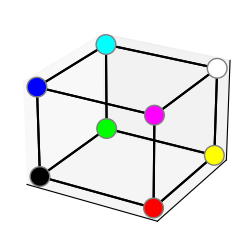

In [9]:
ax = plot_rgb_corners()

We uniformly sample one thousand points from this space and use it to visually compare different
colour spaces. We plot such data in four inserts:
* The leftmost insert is a 3D illustration of sampled points.
* The other three inserts show the same points in 2D planes.

In [10]:
rgb_pts = sample_rgb()
rgb_axs_name = ['R', 'G', 'B']
rgb_axs_range = [[-0.05, 1.05]] * 3

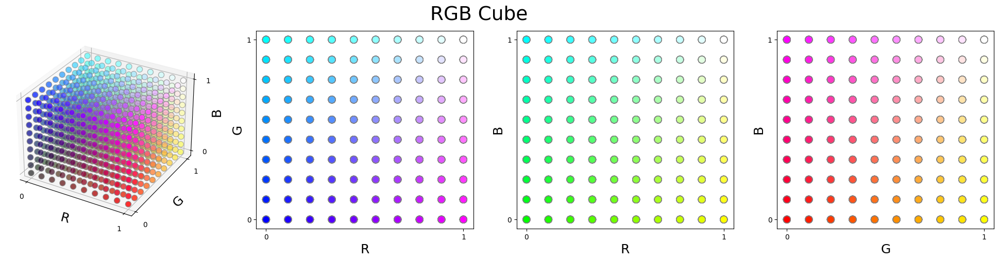

In [206]:
rgb_fig = plot_colour_pts(rgb_pts, rgb_pts, 'RGB Cube', axis_names=rgb_axs_name, axs_range=rgb_axs_range)
rgb_fig.savefig(fig_out_dir + 'rgb_cube.svg')

In the visualisation above, several points lie exacly on top of each other, therefore,
it might be more informative to inspect plane slices of the space without any points overlapping:
 * Coronal: where *R* is constant.
 * Sagittal: where *G* is constant.
 * Transverse: where *B* is constant.

#### Coronal plane

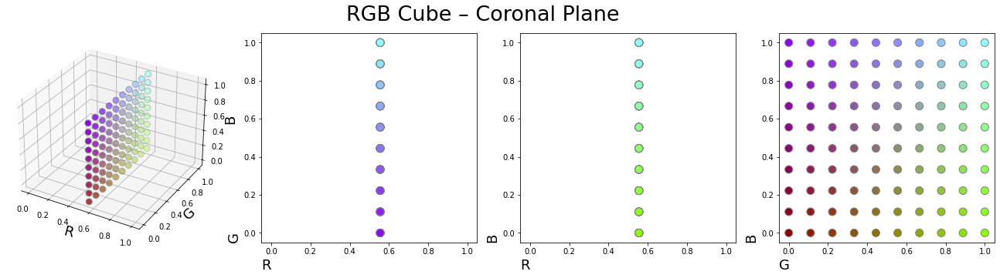

In [8]:
cor_pts = coronal_plane(rgb_pts, 5)
_ = plot_colour_pts(cor_pts, cor_pts, 'RGB Cube – Coronal Plane', axis_names=rgb_axs_name, axs_range=rgb_axs_range)

#### Sagittal plane

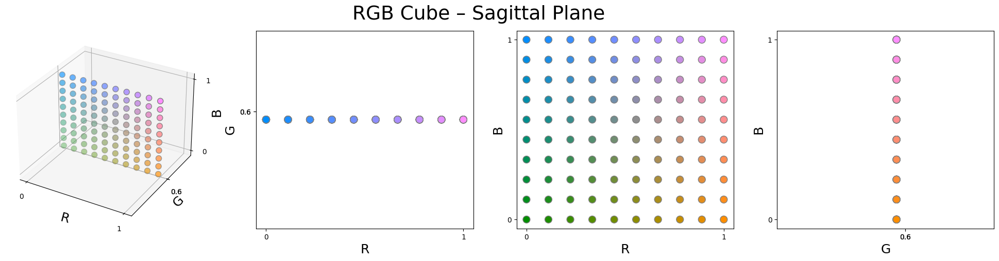

In [208]:
sag_pts = sagittal_plane(rgb_pts, 5)
_ = plot_colour_pts(sag_pts, sag_pts, 'RGB Cube – Sagittal Plane', axis_names=rgb_axs_name, axs_range=rgb_axs_range)

#### Transverse plane

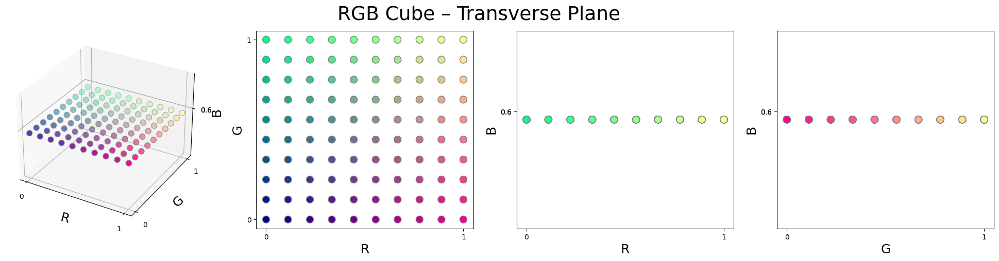

In [207]:
tra_pts = transverse_plane(rgb_pts, 5)
_ = plot_colour_pts(tra_pts, tra_pts, 'RGB Cube – Transverse Plane', axis_names=rgb_axs_name, axs_range=rgb_axs_range)

### Other colour spaces

Let's look at a few other popular colour spaces to obtain a different view of how colour
can be structured in the space. We convert the entire RGB gamut (all the one-thousand RGB points)
into different colour spaces.

#### DKL

The DKL colour space (Derrington-Krauskopf-Lennie) models the opponent responses of rhesus 
monkeys in the early visual system:
* It transforms the RGB by a $3 \times 3$ matrix (i.e., rotation, shearing, scaling and reflection).
* The axes approximately correspond to luminance, red-cyan, and yellow-blue channels.

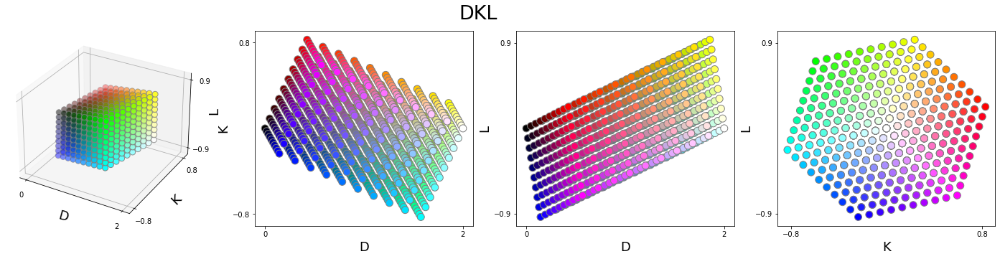

In [46]:
dkl_pts = rgb2dkl(rgb_pts)
dkl_fig = plot_colour_pts(dkl_pts, rgb_pts, 'DKL', axis_names=['D', 'K', 'L'], axs_range='auto')
dkl_fig.savefig(fig_out_dir + 'dkl.svg')

#### YCC

The YCC (also known as $YC_oC_g$ or $YC_1C_2$) decorrelates the RGB channels by a fast computation:
 * It uses a $3 \times 3$ transformation matrix whose coefficients are simple binary fractions.
 * The axes approximately correspond to luminance, orange-blue, and green-violet channels.

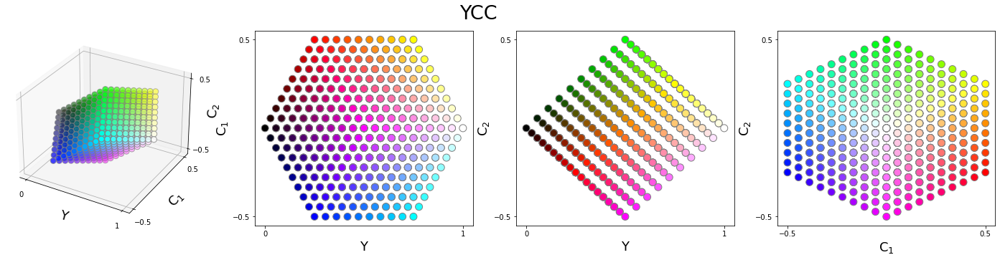

In [48]:
ycc_pts = rgb2ycc(rgb_pts)
ycc_fig = plot_colour_pts(ycc_pts, rgb_pts, 'YCC', axis_names=['Y', 'C$_1$', 'C$_2$'], axs_range='auto')
ycc_fig.savefig(fig_out_dir + 'ycc.svg')

#### HSV

The HSV colour space (hue, saturation, and value) is a cylindrical representation of the RGB 
cube designed by computer graphics:
 * The white and black points are set as the origins of the top and bottom bases of the cylinder.
 * The transformation forces the RGBCMY into a plane to obtain a circular hue.

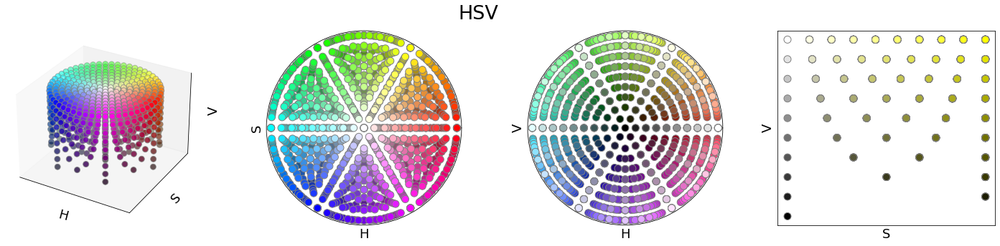

In [50]:
hsv_pts = skicolour.rgb2hsv(rgb_pts)
hsv_pts[..., 0] = hsv_pts[..., 0] * 2 * np.pi
hsv_fig = plot_colour_pts(hsv_pts, rgb_pts, 'HSV', axis_names=['H', 'S', 'V'], projections=['polar', 'polar', None])
hsv_fig.savefig(fig_out_dir + 'hsv.svg')

#### CIE Lab

The CIE Lab colour space (luminance, red-green and yellow-blue axes) intends to be perceptually 
uniform:
* The transformation consists of going into the XYZ space by linearising relative to a *white point*.
* The luminance channel is effectively a power curve with an exponent of $\approx 0.43$.

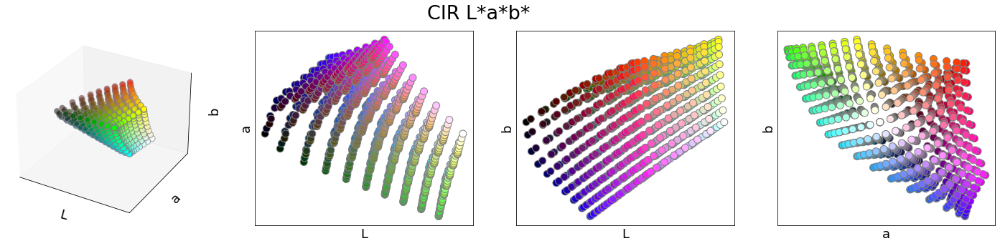

In [49]:
lab_pts = skicolour.rgb2lab(rgb_pts)
lab_fig = plot_colour_pts(lab_pts, rgb_pts, 'CIR L*a*b*', axis_names=['L', 'a', 'b'])
lab_fig.savefig(fig_out_dir + 'lab.svg')

## Colour difference

A colour space is perceptually uniform if the spatial distances between two colours in that
space perfectly match the colour difference humans perceive.

### Human-data

Several studies have measured colour discrimination threshold and colour differences
of human visual system. We rely on the following data:
1. MacAdam ellipses (1942)
2. Luo-Rigg ellipses (1986)
3. MacAdam colour difference (1974)

#### MacAdam Ellipses
The idea behind MacAdam ellipses is that within each ellipse, colours are indiscriminate
to human eyes.

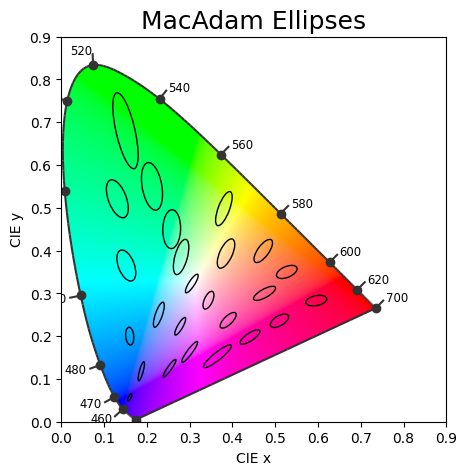

In [404]:
draw_macadam_ellipses()

#### Luo-Rigg Ellipses

The idea behind Luo-Rigg ellipses is similar to MacAdam ellipses. However, contrary to the MacAdam
Luo-Rigg ellipses have different luminance $Y$ values.

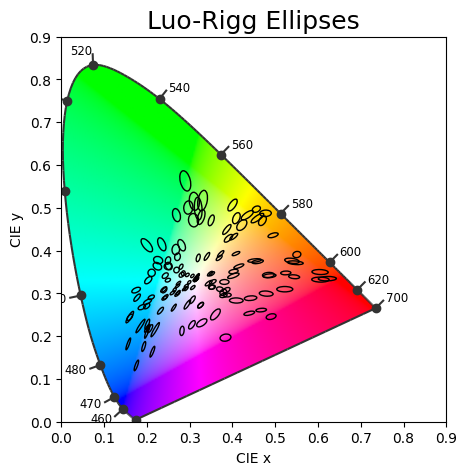

In [403]:
draw_luorigg_ellipses()

#### MacAdam 1974
The lines from each point towards different direction indicates the relative magnitudes of 
colour difference.

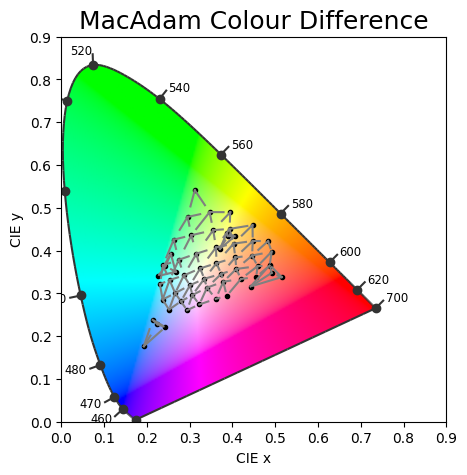

In [407]:
draw_macadam_colour_difference()

#### Quantifying goodness

1. **Colour discrimination data**:

    To quantify **uniformity** of a colour space, we rely on standard deviation ($\sigma$)
    among measured sensitivity thresholds. The figure below depicts the Euclidean distance in RGB
    colour space for a set of measured points. In a perceptually uniform colour space, all these
    distances should have an identical length, therefore:
   * A small standard deviation indicates greater uniformity.
   * A large standard deviation indicates nonuniformity.

    It is important to note that the absolute distance that determines the sensitivity does not 
    determine the uniformity.

    Naturally, the standard deviation depends on the absolute values. Therefore, when comparing
    different colour spaces, we ensure the space is normalised to the range from 0 to 1.

2. **Colour difference data**

   We use the correlation coefficient ($r$) to quantify how much a colour space predicts human
   colour difference data such as MacAdam 1974.

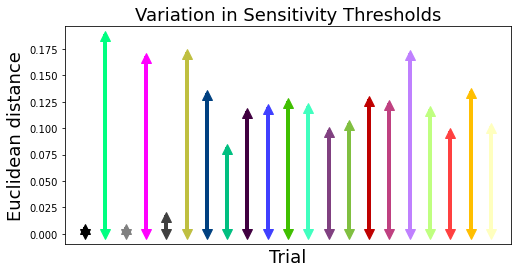

In [54]:
_ = plot_std_explain(res_full_clip_B32['block7'])

### Metrics

To better explain the
problem, we have sampled three orthogonal planes from the RGB space. Next, we will draw lines
between all pairs of neighbouring points according to difference colour difference metrics. **The
line's length indicates the distance between the points**:
* *Longer*  lines denote bigger colour differences.
* *Shorter*  lines denote smaller colour differences.

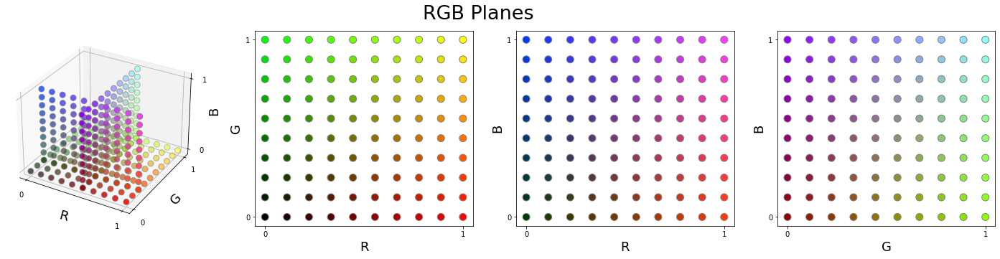

In [59]:
fig = plot_de2000(rgb_pts, [0, 2, 5], title='RGB Planes', diff_fun=euc_distance,
                  axis_names=rgb_axs_name, axs_range=rgb_axs_range, only_planes=True)
fig.savefig(fig_out_dir + 'rgb_planes.svg')

#### Euclidean distance

In the figure below, we have used the Euclidean distance in RGB colour space as our 
colour difference metric. Naturally, since sampled points were drawn from a uniform distribution 
in RGB, the distance between all neighbouring points is identical as depicted by lines.
However, we know that RGB does not capture the perceive colour difference.

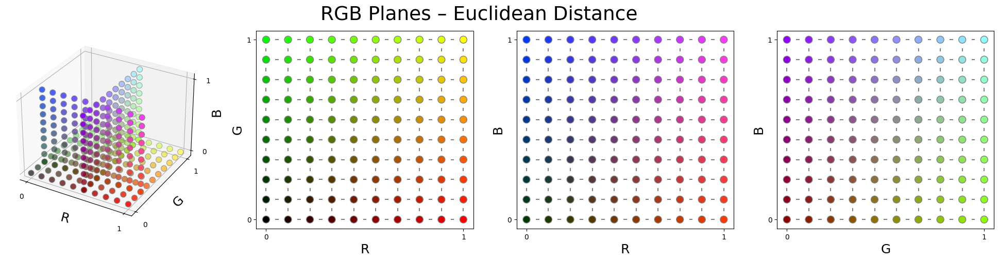

In [240]:
fig = plot_de2000(rgb_pts, [0, 2, 5], title='RGB Planes – Euclidean Distance', diff_fun='euc',
                  axis_names=rgb_axs_name, axs_range=rgb_axs_range)
fig.savefig(fig_out_dir + 'euc_dis.svg')

#### $\Delta E2000$

CIELab colour space was designed to capture the perceived colour difference better.
Since the Euclidean distance in CIELab did not adequately resolve the perceptual uniformity 
issue, the CIE refined their definition and introduced $\Delta E2000$ which is widely used
as the colour difference metric.
The figure below depicts the $\Delta E2000$ distance between neighbouring points. 

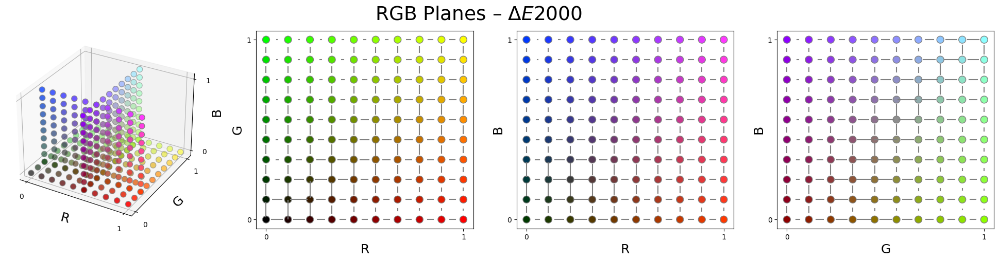

In [238]:
fig = plot_de2000(rgb_pts, [0, 2, 5], title='RGB Planes – $\Delta E2000$', diff_fun='de2000',
                  axis_names=rgb_axs_name, axs_range=rgb_axs_range)
fig.savefig(fig_out_dir + 'de2000.svg')

#### Predicting human data

The figure below compares the prediction power of different colour metrics. The 
* Euclidean distance across different colour spaces (RGB, YCC, DKL, Lab) results in a similar prediction.
* $\Delta E2000$ performs better than any of the Euclidean distances.

Although $\Delta E2000$ is one of the best available colour difference metrics, it has the 
following limitations:
1. It does not fully match the human perceptual distances.
2. It is not a space but a non-Euclidean distance.

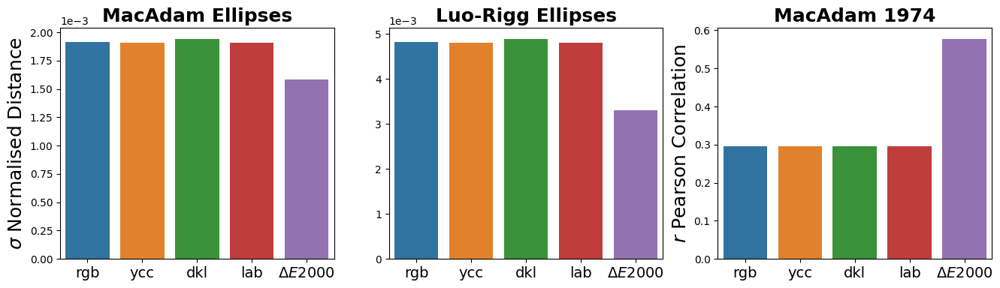

In [136]:
_ = plot_colour_space_predictions()

## Colour discrimination in deep networks

It is impossible to directly ask a neural network trained on a task like object 
recognition about colour discrimination, as the neural network was specifically 
trained for another task. To overcome this, we trained a linear classifier to 
perform a 4AFC colour discrimination task, and at test time systematically
measured the network's sensitivity at different points. That is to say, the framework to evaluate 
the colour discrimination thresholds in deep networks consists of two steps:
1. A network is trained on an arbitrary visual task (e.g., object recognition).
   We refer to such a network as a **pretrained network**.
2. Features extracted from the **frozen** pretrained network are input to a linear
   classifier trained for the colour discrimination 4AFC task. We refer to
   the trained linear classifier as a **colour-discriminator**.

### Training colour discriminator

The figure below shows the schematics of our training process.

<img src="../presentations/DeepReconciliationOfCategoricalColourPerception/colour_discriminator.png">

The process of extracting features (also known as, readouts) from a pretrained 
network can occur at any depth of a network. We extract features from six distinct
layers from the early to final layer:
 * Common to all architectures: `fc` for *ImageNet* (classification layer) or `encoder`
   for *Taskonomy* (the final encoding layer) and *CLIP* (the final vision layer).
 * In the case of `ResNet50` architecture, from 5 intermediate areas (a collection
   of residual blocks).
 * In the case of `ViT-B32` from blocks `[1, 4, 7, 10, 11]`.

#### Train images

During the training, the linear classifier is input with four images:
 * Three of those are identical.
 * One odd image that only differs in colour.

The colour difference between common-odd images is drawn from a random uniform
distribution ensuring no colour bias is introduced in the colour discriminator
training.

The background colour is always achromatic whose luminance is drawn from a random
uniform distribution

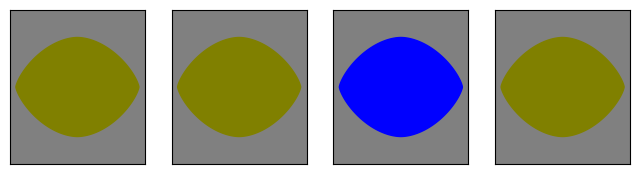

In [413]:
colours = [[0.5, 0.5, 0], [0.5, 0.5, 0], [0.0, 0, 1], [0.5, 0.5, 0]]
plot_random_shape(colours)

### Testing paradigm

To estimate networks' colour sensitivity thresholds, we followed the standard staircase
procedure to adjust the colour of the odd-one-out item until the network's accuracy reached 
$62.5 \%$. At each trial, this accuracy is computed over 2905 shapes. The figure below 
illustrates a real example of the staircase procedure.

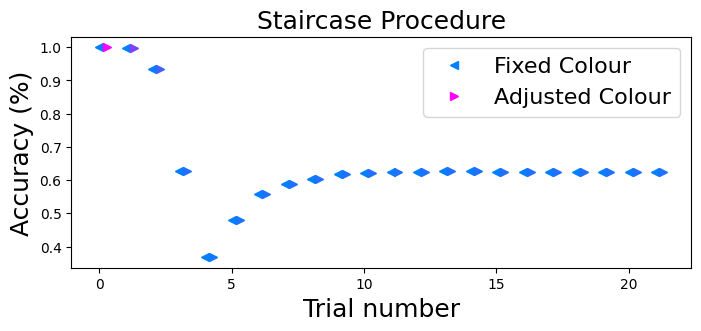

In [72]:
_ = plot_staircase(
    '../results/colour_discrimination/bw_4afc_rgb/bg_128/clip/clip_B32/bg128_i0/block7/',
    'rgb005_5'
)

### Pretrained networks

Architectures:
* **Vision Transformers (ViT)** – *ViT-B32*
* **Convolutional Neural Networks (CNN)** – *ResNet50*

Pretrained task:
* **CLIP**: multimodal text-image matching
* **ImageNet**: unimodal object classification

Intermediate layers: six distinct layers corresponding to low-, mid- and high-level visual representation.

In [13]:
arch_areas = {
    'clip_RN50': [*['area%d' % i for i in range(0, 5)], 'encoder'],
    'clip_B32': [*['block%d' % i for i in [1,4,7,10,11]], 'encoder'],
    'resnet50': [*['area%d' % i for i in range(0, 5)], 'fc'],
    'vit_b_32': [*['block%d' % i for i in [1,4,7,10,11]], 'fc']
}

### Test Points

We sampled the RGB space uniformly with steps of $0.25$. This results in 125 test points, which
are illustrated in the figure below.

In [13]:
rgb_test_data = read_test_pts('../data/test_pts/rgb_points_sampled_025.csv')
rgb_ref_pts = np.array([val['ref'] for val in rgb_test_data.values()])

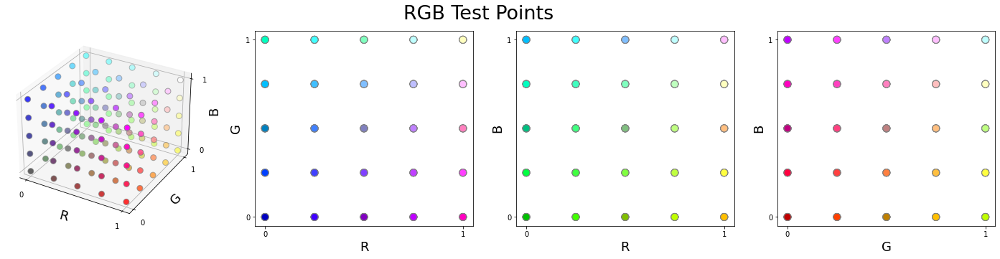

In [47]:
fig = plot_colour_pts(rgb_ref_pts, rgb_ref_pts, 'RGB Test Points', 
                      axis_names=rgb_axs_name, axs_range=rgb_axs_range)
# fig.savefig(fig_out_dir + 'sampled_space.svg')

From each test point, we computed the sensitivity towards the outer surface of the RGB cube.
An example of this is illustrated in the figure below.

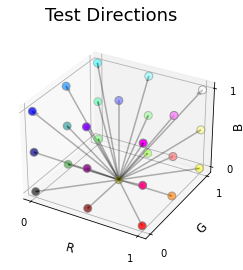

In [48]:
fig = plot_test_direction(rgb_test_data, 'rgb012')
fig.savefig(fig_out_dir + 'test_direction.svg')

## Results

For each pretrained network we trained five instances of linear classifier. The results across
these five instances are identical, therefore in this notebook we report the results only for
one instance.

### Explaining with one example

We will look at the results of *Block-7* of the *ViT-B32* architecture (i.e.,
the image encoder of CLIP). The directory name `bg128_i0` means the linear classifier
(colour discriminator) has been trained with images of a grey background ($R=G=B=127$).

#### Raw sensitivity thresholds

In the figure below, we have visualised the sensitivity threshold for **125 test points** summing to a total of **3274 comparisons**. The inserts are sorted following the standard deviation in sensitivity thresholds for the test colours. In each insert, the square marker indicates the test colour whose RGB coordinates are also written in the title.
All circles correspond to the sensitivity threshold in different directions.

We can observe:
* Some of the point clouds are very small while others spread.
* If RGB were the perceptually uniform space for this layer, we would see equal-sized point clouds for all test points.
* This nonuniformity suggests more sensitivity at certain parts of the colour space is useful for the pretrained task.

In [49]:
rgb_test_data = read_test_pts('../data/test_pts/rgb_points_sampled_025.csv')
net_res_dir = '../results/colour_discrimination/bw_4afc_rgb/bg_128/clip/clip_B32/bg128_i0/'
res_full_clip_B32 = parse_network_results(net_res_dir, 'clip_B32', rgb_test_data)

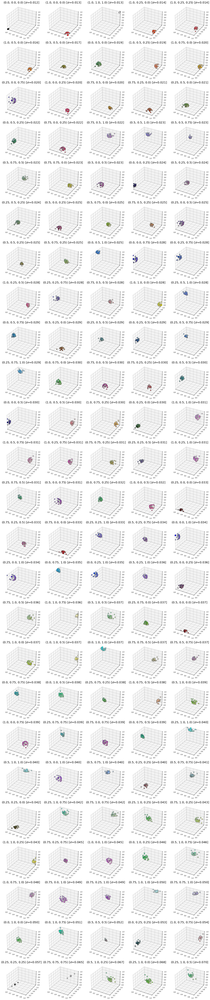

In [153]:
ex_sen_fig = plot_area_colour_thresholds(res_full_clip_B32['block7'], title='CLIP ViT-B32')
ex_sen_fig.savefig(fig_out_dir + 'clip_b32_i00_block7.svg')

#### Quantifying uniformity

We can compute the uniformity metric (standard deviation among distances) for different colour
spaces and colour difference metrics. Overall, we can see the values of $\sigma$ are small across
colour spaces:
* Smaller standard deviation in YCC and DKL colour space in comparison to RGB suggests these colour spaces are perceptually more uniform for this layer.
* $\Delta E$ of 2.58 is slightly above JND, suggesting the network's colour sensitivity is not far away from humans.

In [55]:
clip_B32_colour_diff = colour_diff_all_areas(res_full_clip_B32)

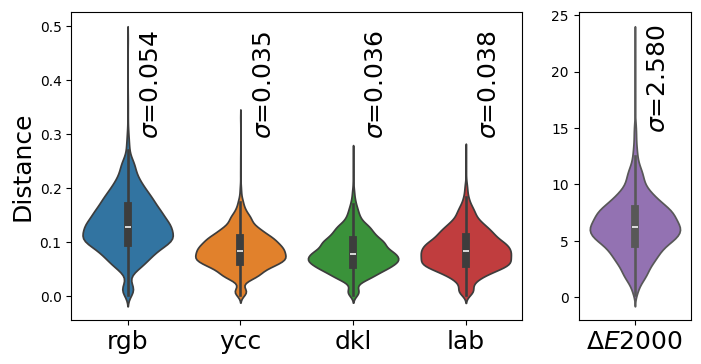

In [138]:
_ = plot_colour_diff_dist(clip_B32_colour_diff['block7'])

### The role of architecture

Plotting the sensitivity thresholds for all 125 test points across six readout layers results in
too big of a figure. But to showcase the differences across layers (from early- to mid- and
deep layers) we illustrate the sensitivity thresholds for all eight corners of the RGB cube.

In [11]:
primary_inds = [0, 2, 6, 8, 18, 20, 24, 26]
rgb_test_data = read_test_pts('../data/test_pts/rgb_points_sampled_025.csv')

#### CLIP - ViT-B32

In [14]:
net_res_dir = '../results/colour_discrimination/bw_4afc_rgb/bg_128/clip/clip_B32/bg128_i0/'
res_full_clip_B32 = parse_network_results(net_res_dir, 'clip_B32', rgb_test_data)
clip_B32_colour_diff = colour_diff_all_areas(res_full_clip_B32)

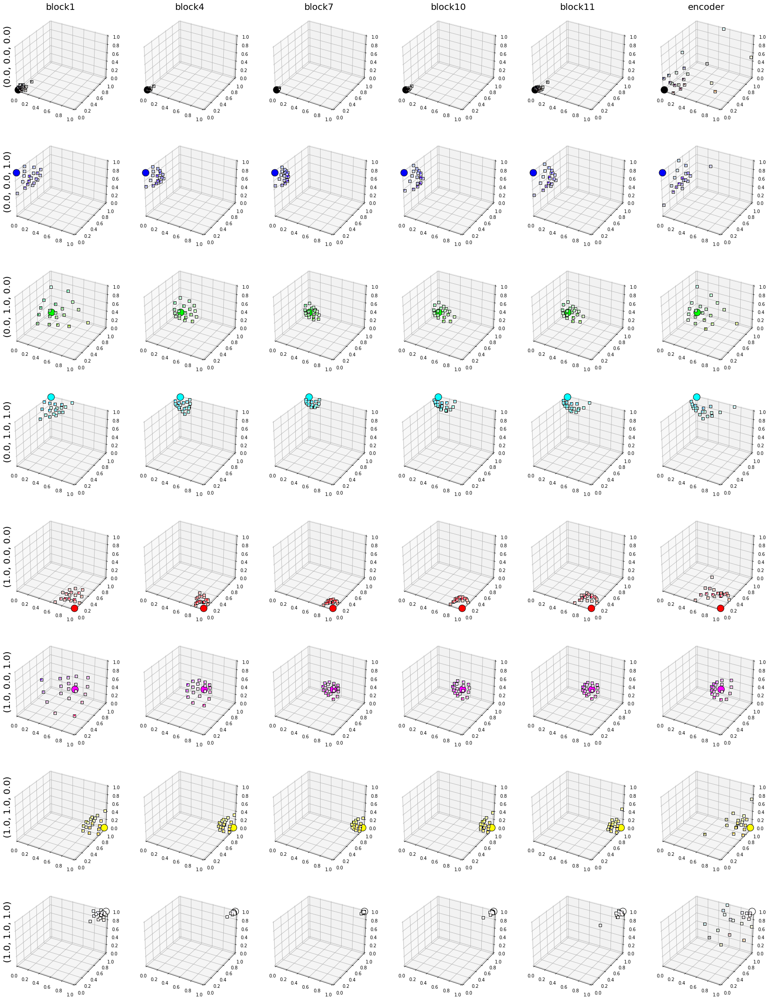

In [175]:
clip_B32_full_fig = plot_network_colour_thresholds(res_full_clip_B32, primary_inds)
clip_B32_full_fig.savefig(fig_out_dir + 'clip_b32_i00.svg')

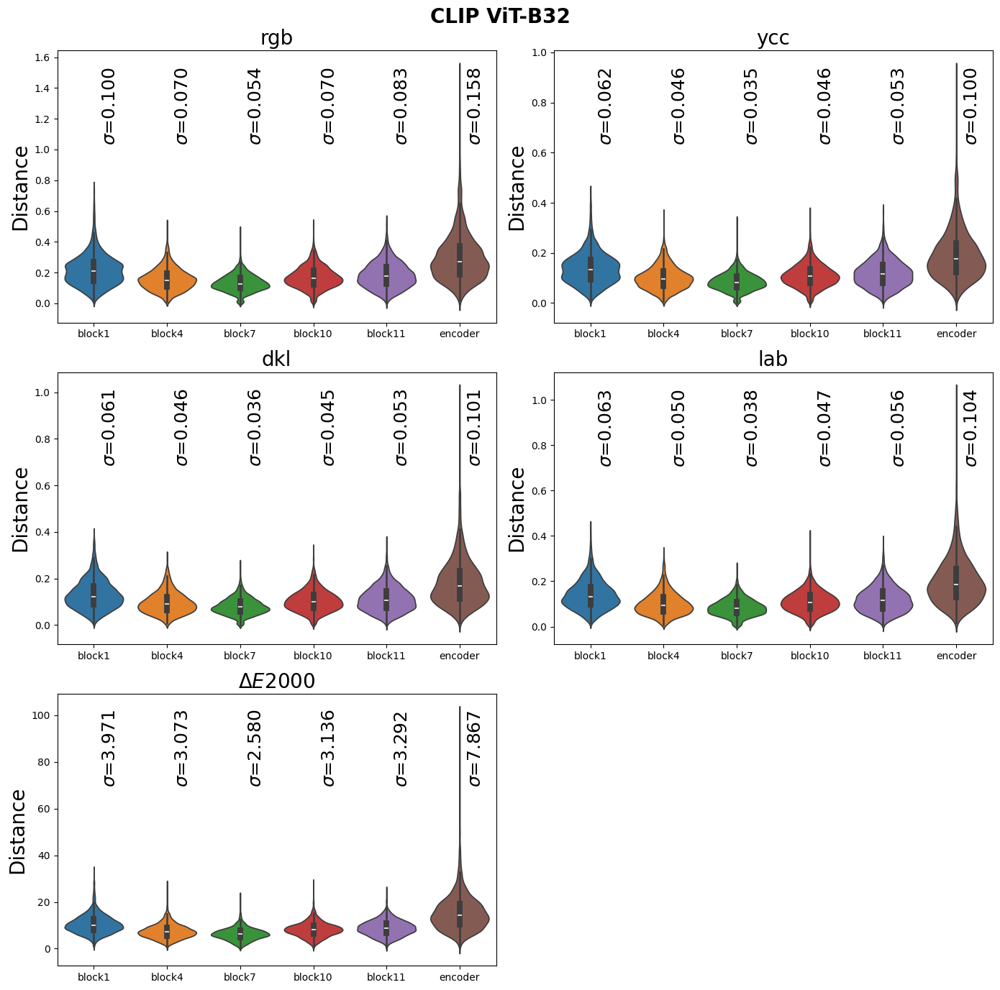

In [26]:
_ = plot_stds_layers_metrics(clip_B32_colour_diff, 'CLIP ViT-B32')

#### CLIP - ResNet50

In [20]:
net_res_dir = '../results/colour_discrimination/bw_4afc_rgb/bg_128/clip/clip_RN50/bg128_i0/'
res_full_clip_RN50 = parse_network_results(net_res_dir, 'clip_RN50', rgb_test_data)
clip_RN50_colour_diff = colour_diff_all_areas(res_full_clip_RN50)

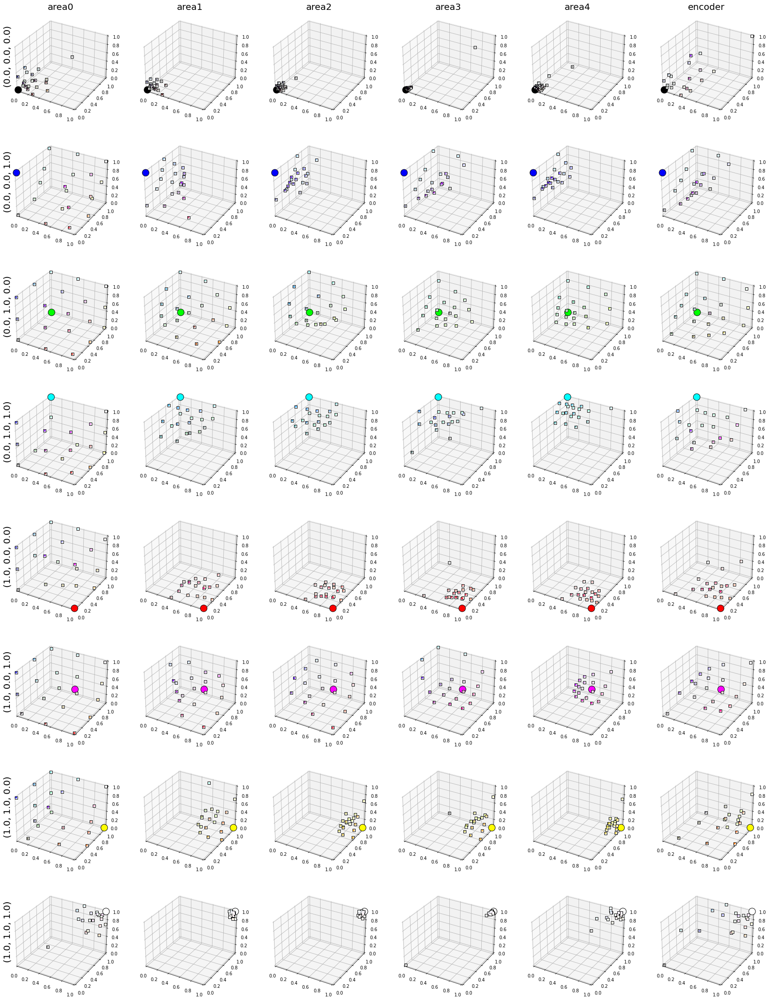

In [16]:
clip_RN50_full_fig = plot_network_colour_thresholds(res_full_clip_RN50, primary_inds)
clip_RN50_full_fig.savefig(fig_out_dir + 'clip_rn50_i00.svg')

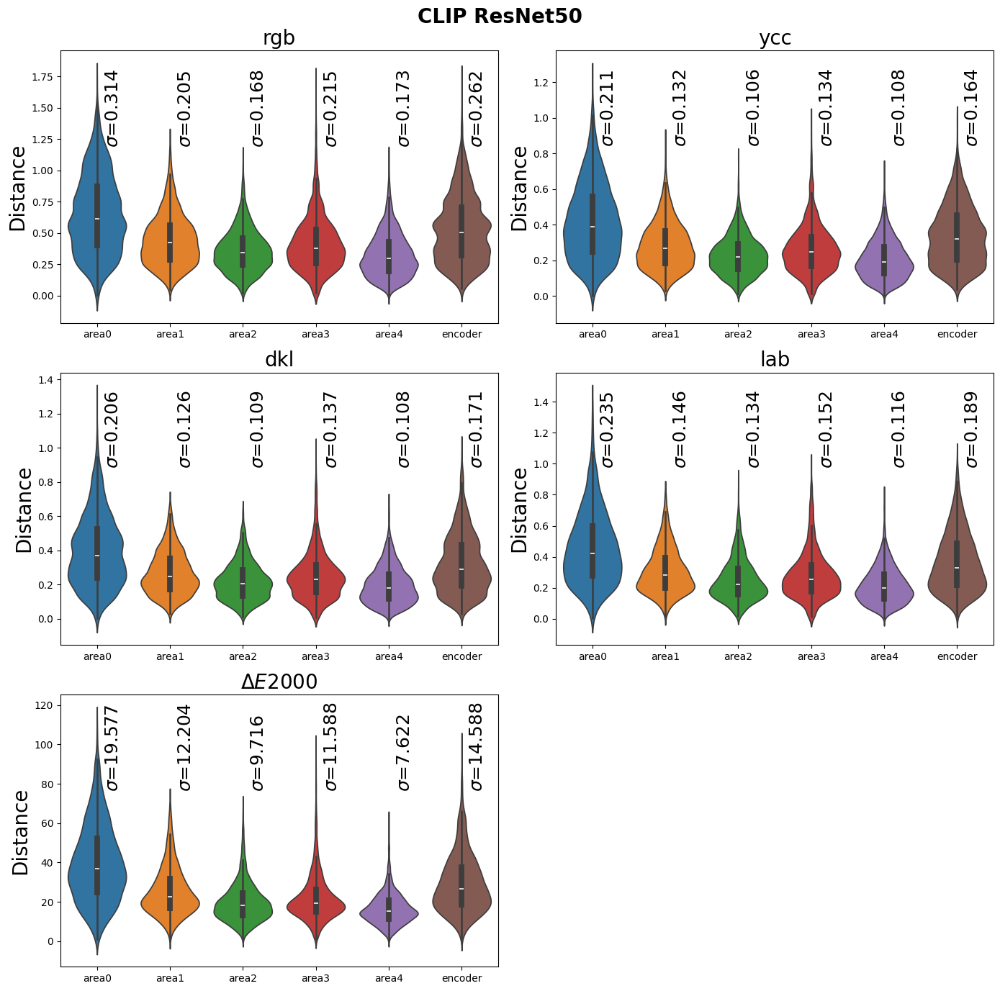

In [25]:
_ = plot_stds_layers_metrics(clip_RN50_colour_diff, 'CLIP ResNet50')

#### ImageNet - ViT-B32

In [19]:
net_res_dir = '../results/colour_discrimination/bw_4afc_rgb/bg_128/imagenet/vit_b_32/bg128_i0/'
res_full_vit_b32 = parse_network_results(net_res_dir, 'vit_b_32', rgb_test_data)
vit_b32_colour_diff = colour_diff_all_areas(res_full_vit_b32)

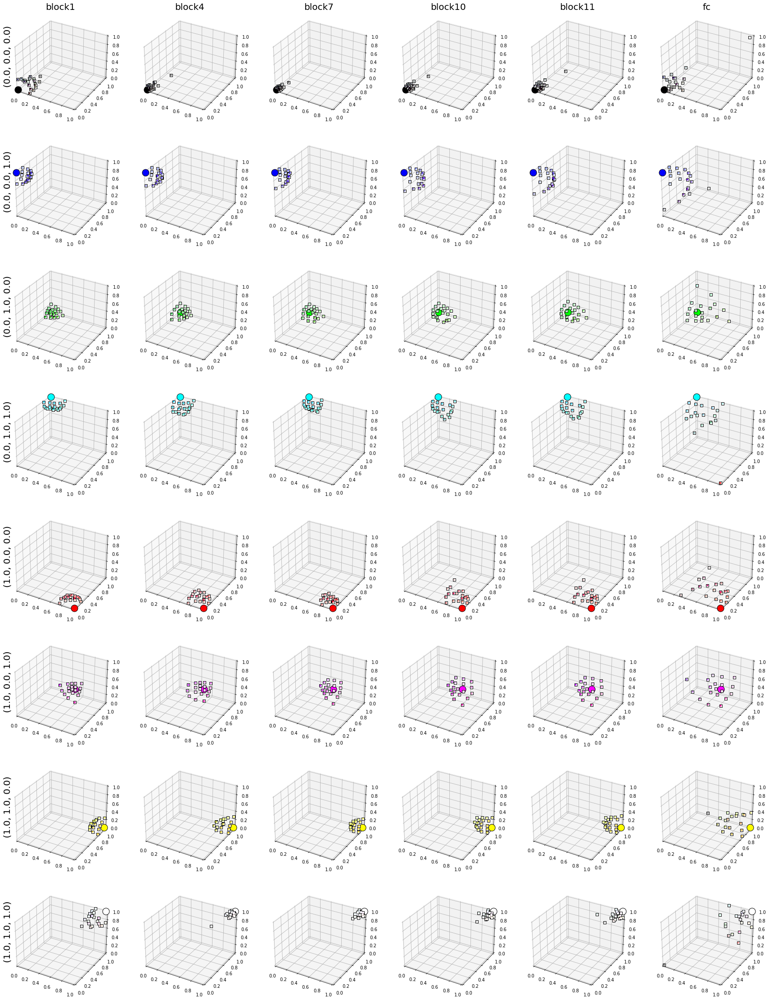

In [18]:
vit_b32_full_fig = plot_network_colour_thresholds(res_full_vit_b32, primary_inds)
vit_b32_full_fig.savefig(fig_out_dir + 'vit_b32_i00.svg')

#### ImageNet - ResNet50

In [21]:
net_res_dir = '../results/colour_discrimination/bw_4afc_rgb/bg_128/imagenet/resnet50/bg128_i0/'
res_full_resnet50 = parse_network_results(net_res_dir, 'resnet50', rgb_test_data)
resnet50_colour_diff = colour_diff_all_areas(res_full_resnet50)

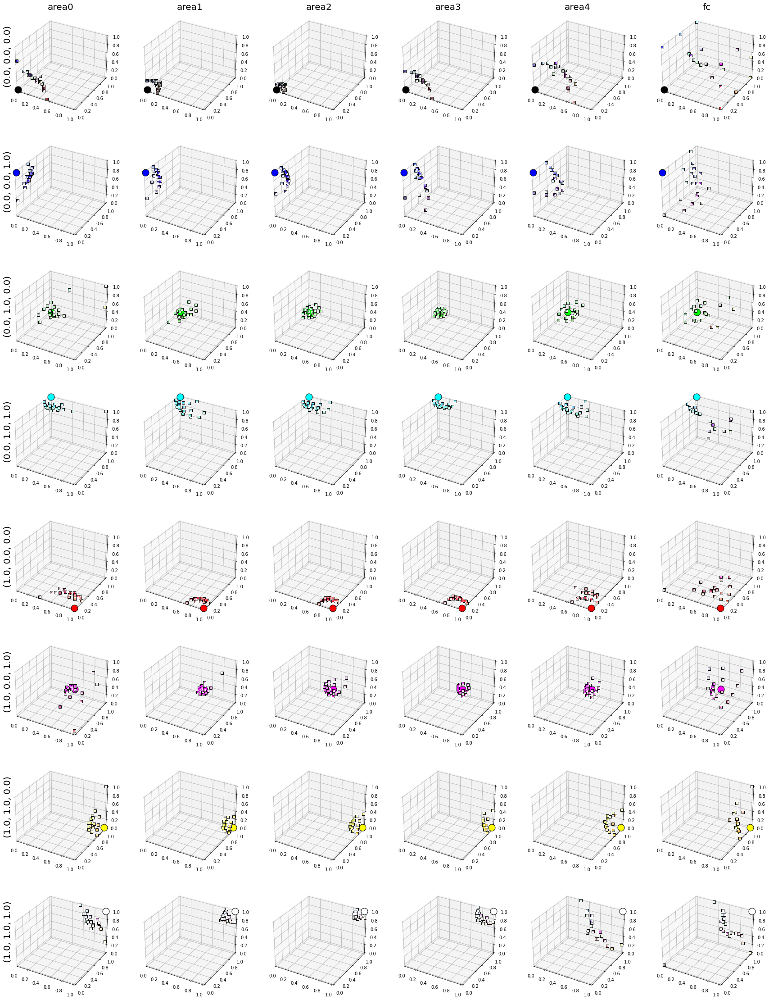

In [21]:
resnet50_full_fig = plot_network_colour_thresholds(res_full_resnet50, primary_inds)
resnet50_full_fig.savefig(fig_out_dir + 'resnet50_i00.svg')

#### Transformer vs. Convolution Networks

The figure below compares the colour sensitivity of networks in a confusion matrix style like
across two tasks and two architectures:
 * There is no significant difference between columns one and two, suggesting that language does not crucially impact the network's colour sensitivity thresholds.
 * A large difference can be observed between the first and second rows, suggesting a strong role of the network's architecture in the network's colour sensitivity thresholds. **Vison Transformers (ViT) obtain considerably lower $\Delta E2000$s, which suggests they capture human sensitivity better than  convolutional networks.**

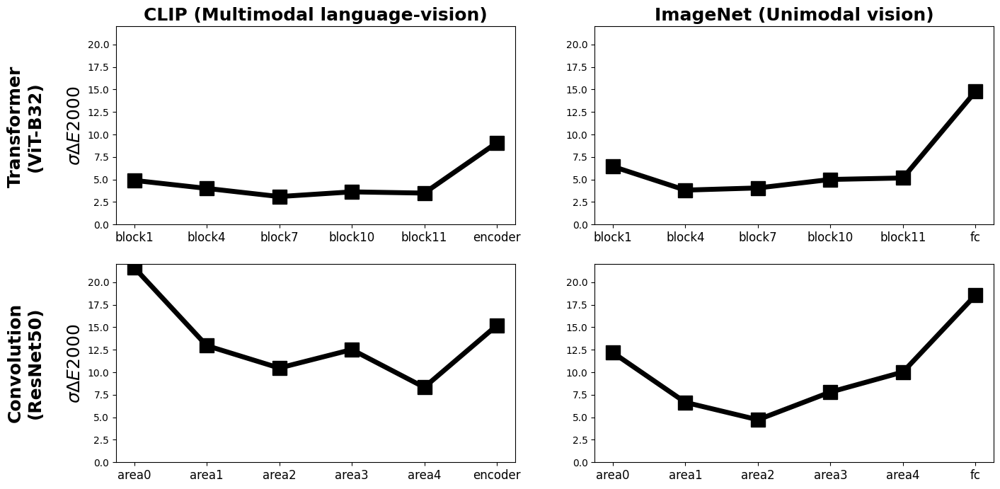

In [59]:
titles = {
    'clip_B32': 'CLIP (Multimodal language-vision)',
    'clip_RN50': 'CLIP (Multimodal language-vision)',
    'vit_b_32': 'ImageNet (Unimodal vision)',
    'resnet50': 'ImageNet (Unimodal vision)'
}
clip_vs_imagenet = {
    'clip_B32': clip_B32_colour_diff,
    'vit_b_32': vit_b32_colour_diff,
    'clip_RN50': clip_RN50_colour_diff,
    'resnet50': resnet50_colour_diff,
}
for net_name, full_diffs in clip_vs_imagenet.items():
    clip_vs_imagenet[net_name] = [np.std(val['de2000']) for val in full_diffs.values()]
fig = plt.figure(figsize=(16, 8))
axs = fig.subplots(2, 2)
for net_ind, (net_type, net_res) in enumerate(clip_vs_imagenet.items()):
    ax = axs.flat[net_ind]
    ax.plot(net_res, '-s',  
            color='black', linewidth=5, markersize=15, alpha=1)
    if net_ind in [0, 2]:
        ax.set_ylabel('$\sigma \Delta E2000$', fontsize=18)
    ax.set_ylim([0, 22])
    labels = arch_areas[net_type].copy()
    ax.set_xticks(range(len(labels)), labels, fontsize=12)
    if net_ind < 2:
        ax.set_title(titles[net_type], fontsize=18, fontweight='bold')
    if net_ind == 0:
        ax.text(-1.5, 4.5, 'Transformer\n(ViT-B32)', fontsize=18, fontweight='bold', 
                rotation='vertical', horizontalalignment='center')
    if net_ind == 2:
        ax.text(-1.5, 4.8, 'Convolution\n(ResNet50)', fontsize=18, fontweight='bold', 
                rotation='vertical', horizontalalignment='center')
# fig.savefig(fig_out_dir + '/clip_vs_imagenet.svg')

## Optimising a uniform space

Now that we have measured a large set of sensitivity thresholds for a network/layer, we can
use optimisation techniques to transform the input space (RGB, i.e., the input space of all
examined pretrained networks is RGB) to a new space (we refer to it as *network-space*), where
the standard deviation in the Euclidean distance of all measured distances equals zero
($\sigma_{network-space}=0)$.

There are at least two good candidates to perform this optimisation:
 1. **Classical minimisation**: defining the type of transformation (e.g., $3 \times 3$ matrix or affine transformation, with or without exponential factor and certain nonlinearities.
 2. **Neural networks**: deciding a neural network (i.e., set of linear and nonlinear layers) to find the optimal solution.

The benefit of the "classical minimisation" approach is that the inverse operation is given.
However, it is limited to a design envisaged by us, therefore perhaps not finding the true
uniform space.
The benefit of the "neural networks" approach is its flexibility in finding an optimal solution.
The drawback is that the inverse to RGB is not given and must be approximated.

### Neural networks

We can train a simple neural network with a few hidden (intermediate) layers to transform RGB
input space to output network-space. An example of such a network is depicted in the figure below:
* This is not a schematic illustration and the number of nodes corresponds to a real scenario.
* The neural networks trained to find the uniform colour space are shallow with a few hundred parameters.
* All layers are fully-connected (also known as linear or dense layer), where all input nodes are connected to all output nodes.
* Between any two dense layers, there is a nonlinear activation function.

We can perform a hyperparameter search about:
* The number of hidden layers.
* The number of units in each layer.
* The type of nonlinearity function at each layer.

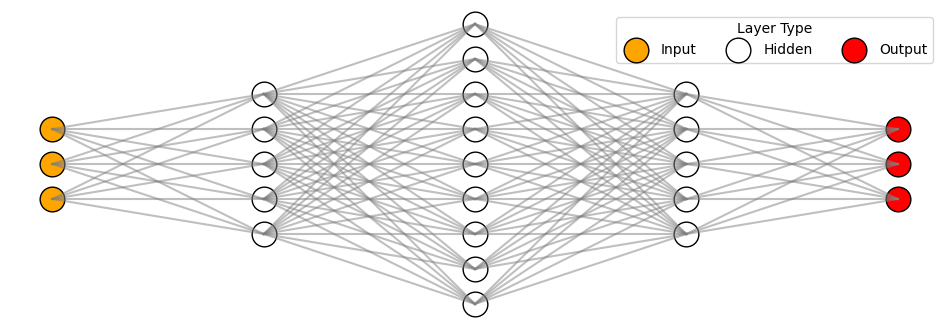

In [142]:
_ = draw_neural_net([3, 5, 9, 5, 3])

In [349]:
def train_test_splits(layer_results, test_perc=0.1):
    num_centres = layer_results['cat_cen'].shape[0]
    num_tests = int(num_centres * test_perc)
    data_inds = np.arange(num_centres)
    np.random.shuffle(data_inds)
    train_inds = data_inds[:num_centres - num_tests]
    test_inds = data_inds[num_centres - num_tests:]
    train_split = {
        'cat_cen': layer_results['cat_cen'][train_inds],
        'cat_bor': layer_results['cat_bor'][train_inds]
    }
    test_split = {
        'cat_cen': layer_results['cat_cen'][test_inds],
        'cat_bor': layer_results['cat_bor'][test_inds]
    }
    return train_split, test_split


def train_val_sets(layer_results, val_perc=0.1):
    num_centres = layer_results['cat_cen'].shape[0]
    num_vals = int(num_centres * val_perc)
    data_inds = np.arange(num_centres)
    np.random.shuffle(data_inds)
    val_inds = data_inds[num_centres - num_vals:]

    centre_data = layer_results['cat_cen'].copy()
    border_data = layer_results['cat_bor'].copy()
    train_pts, train_map_inds = [], []
    val_pts, val_map_inds = [], []
    for centre_ind, centre_pt in enumerate(centre_data):
        all_pts = val_pts if centre_ind in val_inds else train_pts
        map_inds = val_map_inds if centre_ind in val_inds else train_map_inds
        all_pts.append(centre_pt)
        cen_in_ind = len(all_pts) - 1
        for border_pt in border_data[centre_ind]:
            all_pts.append(border_pt)
            bor_in_ind = len(all_pts) - 1
            map_inds.append([cen_in_ind, bor_in_ind])
    train_pts = np.array(train_pts, dtype='float32')
    train_map_inds = np.array(train_map_inds)
    val_pts = np.array(val_pts, dtype='float32')
    val_map_inds = np.array(val_map_inds)
    return (train_pts, train_map_inds), (val_pts, val_map_inds)


class ColourSpaceNet(nn.Module):
    def __init__(self, units=None, nonlinearities='GELU', mean_std=None):
        super().__init__()
        self.mean_std = (0, 1) if mean_std is None else mean_std
        if units is None:
            units = [7, 15, 7]
        num_units = [int(unit) for unit in units]
        in_units = [3, *num_units]
        out_units = [*num_units, 3]
        if type(nonlinearities) is not list:
            nonlinearities = [nonlinearities] * (len(num_units) + 1)
        nonlinear_units = [non_linear_funs[nonlinearity] for nonlinearity in nonlinearities]
            
        layers = []
        for i in range(len(num_units) + 1):
            layers.append(nn.Linear(in_units[i], out_units[i]))
            layers.append(nonlinear_units[i])
        self.layers = nn.Sequential(*layers)

    def forward(self, x):
        x = self.layers(x)
        return x


def pred_model(model, rgbs):
    model = model.eval()
    with torch.set_grad_enabled(False):
        input_space = torch.tensor(rgbs.copy()).float()
        out_space = model(input_space)
    return out_space.numpy()


non_linear_funs = {
    'GELU': nn.GELU(),
    'ReLU': nn.ReLU(),
    'SELU': nn.SELU(),
    'SiLU': nn.SiLU(),
    'Tanh': nn.Tanh(),
    'Sigmoid': nn.Sigmoid(),
    'identity': nn.Identity()
}


optimisers = {
    'Adam': torch.optim.Adam,
    'Adamax': torch.optim.Adamax,
    'Adagrad': torch.optim.Adagrad,
    'SGD': torch.optim.SGD,
}


def load_model(path, return_info=False):
    model_info = torch.load(path, map_location='cpu')
    model = ColourSpaceNet(
        model_info['units'], 
        model_info['nonlinearities'],
        model_info['mean_std'],
    )
    model.load_state_dict(model_info['state_dict'])
    if return_info:
        return model, model_info['units'], model_info['nonlinearities']
    return model


def plot_losses(losses):
    depred = pred_human_data('de2000')
    
    fontsize = 18
    fig = plt.figure(figsize=(18, 4))
    ax = fig.add_subplot(1, 3, 1)
    ax.plot(losses[:, 0], color='red')
    ax.ticklabel_format(style='scientific', axis='y', scilimits=(0, 0))
    ax.set_title('Loss function', fontsize=fontsize, fontweight='bold')
    ax.set_xlabel('Epochs', fontsize=fontsize)
    ax.set_ylabel('$\sigma$ Euclidean Distance', fontsize=fontsize)
    
    ax = fig.add_subplot(1, 3, 2)
    ax.plot(losses[:, 2], label='MacAdam', color='blue')
    ax.plot(losses[:, 4], label='Luo-Rigg', color='magenta')
    ax.hlines(depred['MacAdam'][1], 0, losses.shape[0], linestyles='--', label='$\Delta E2000$ MA', color='blue')
    ax.hlines(depred['Luo-Rigg'][1], 0, losses.shape[0], linestyles='--', label='$\Delta E2000$ LR', color='magenta')
    ax.ticklabel_format(style='scientific', axis='y', scilimits=(0, 0))
    ax.set_title('Human Ellipses', fontsize=fontsize, fontweight='bold')
    ax.set_xlabel('Epochs', fontsize=fontsize)
    ax.set_ylabel('$\sigma$ Euclidean Distance', fontsize=fontsize)
    ax.legend(fontsize=13, ncol=2, loc='upper right')
    
    ax = fig.add_subplot(1, 3, 3)
    ax.plot(losses[:, 5], color='black')
    ax.hlines(depred['MacAdam1974'][1], 0, losses.shape[0], linestyles='--', label='$\Delta E2000$', color='black')
    ax.set_title('MacAdam 1974', fontsize=fontsize, fontweight='bold')
    ax.set_xlabel('Epochs', fontsize=fontsize)
    ax.set_ylabel('$r$ Pearson Correlation', fontsize=fontsize)
    ax.legend(fontsize=13, ncol=2, loc='lower right')
    return fig


def plot_model_summary(model_path):
    network_losses = np.loadtxt(model_path + 'losses.txt', delimiter=',')
    loaded_model, units, nonlinearities = load_model(model_path + 'model.pth', return_info=True)
    fig_loss = plot_losses(network_losses)
    rgb_squeezed = rgb_pts.copy().squeeze()
    rgb_pts_pred = pred_model(loaded_model, rgb_squeezed)
    rgb_pts_pred = np.expand_dims(rgb_pts_pred, axis=1)
    fig_rgb = plot_colour_pts(rgb_pts_pred, rgb_pts, '"Perceptually Uniform Space" – Network units: %s' % (str(tuple(units))),
                        axs_range='auto')
    return fig_loss, fig_rgb

#### Training

We train our *perceptually uniform colour space network* (**PucsNet**) with following settings:
* 0.1 learning rate, which is reduced by one order of magnitude at every one-third of total epochs.
* 5000 epochs
* At every epoch, PucsNet transfers 3274 RGB points into the new space.
* The main term in the loss function is the uniformity metric (i.e., standard deviation among all measured distances). However, without any further constraint, the first solution the network finds is to make the data range tiny, which is not a valid solution. Therefore, we add a second term to our loss function to ensure the output range is approximately 0 to 1. 

In [341]:
def optimise_instance(args, layer_results, out_dir):
    mean_std = (0.5, 0.5)
    # model
    model = ColourSpaceNet(args.num_units, args.nonlinearities, mean_std)
    print(model)

    # optimisation
    optimiser = optimisers[args.opt_method](params=model.parameters(), lr=args.lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimiser, step_size=args.epochs // 3)

    # epoch loop
    print_freq = args.epochs // 10
    losses = []
    for epoch in range(args.epochs):
        model = model.train()
        train_db, _ = train_val_sets(layer_results, 0.1)
        with torch.set_grad_enabled(True):
            input_space = torch.tensor(train_db[0].copy()).float()
            out_space = model(input_space)
            euc_dis = torch.sum((out_space[train_db[1][:, 0]] - out_space[train_db[1][:, 1]]) ** 2, axis=-1) ** 0.5
            min_vals, _ = out_space.min(axis=0)
            max_vals, _ = out_space.max(axis=0)
            range_dis = max_vals - min_vals
            uniformity_euc_dis = torch.std(euc_dis)
            if args.loss == 'range':
                range_loss = 0.5 * (
                        abs(1 - range_dis[0]) + abs(1 - range_dis[1]) + abs(1 - range_dis[2])
                )
            elif args.loss == 'mean_distance':
                range_loss = 0.5 * abs(0.1 - torch.mean(euc_dis))
            else:
                range_loss = 0
            loss  = uniformity_euc_dis + range_loss

            optimiser.zero_grad()
            loss.backward()
            optimiser.step()
            scheduler.step()

        if torch.isnan(loss):
            print('NaN!', epoch)
            return

        if np.mod(epoch, print_freq) == 0 or epoch == (args.epochs-1):
            human_tests = compare_human_data(model, False)
            print(
                '[%.5d] loss=%.4f MacAdam=[%.4f|%.4f]vs[%.4f] Luo-Rigg=[%.4f|%.4f]vs[%.4f] r=[%.2f]vs[%.2f]' % (
                    epoch, uniformity_euc_dis,
                    human_tests['MacAdam']['model'][0], human_tests['MacAdam']['model'][1],
                    human_tests['MacAdam']['de2000'][1],
                    human_tests['Luo-Rigg']['model'][0], human_tests['Luo-Rigg']['model'][1],
                    human_tests['Luo-Rigg']['de2000'][1],
                    human_tests['MacAdam1974']['model'][0], human_tests['MacAdam1974']['de2000'][0]
                )
            )
        losses.append([
            uniformity_euc_dis.item(),
            human_tests['MacAdam']['model'][0], human_tests['MacAdam']['model'][1],
            human_tests['Luo-Rigg']['model'][0], human_tests['Luo-Rigg']['model'][1],
            human_tests['MacAdam1974']['model'][0]
        ])

    rgb_pts = sample_rgb()
    rgb_squeezed = rgb_pts.copy().squeeze()
    rgb_pts_pred = pred_model(model, rgb_squeezed)
    rgb_pts_pred = np.expand_dims(rgb_pts_pred, axis=1)
    space_range = list(rgb_pts_pred.max(axis=(0, 1)) - rgb_pts_pred.min(axis=(0, 1)))
    print('Network-space range:\t%s (%.3f, %.3f %.3f)' % ('', *space_range))
    fig = plot_colour_pts(
        rgb_pts_pred, rgb_pts,
        'loss=%.4f   MacAdam=%.4f|%.4f   Luo-Rigg=%.4f|%.4f   r=%.2f' % (
            losses[-1][0], losses[-1][1], losses[-1][2], losses[-1][3], losses[-1][4], losses[-1][5]
        ),
        axs_range='auto'
    )

    fig.savefig('%s/rgb_pred.svg' % out_dir)
    header = 'loss,MacAdam_raw,MacAdam_norm,LuoRigg_raw,LuoRigg_norm,Corr'
    np.savetxt('%s/losses.txt' % out_dir, losses, delimiter=',', header=header)

    torch.save({
        'state_dict': model.state_dict(),
        'units': args.num_units,
        'nonlinearities': args.nonlinearities,
        'mean_std': mean_std
    }, '%s/model.pth' % out_dir)
    return model, fig, np.array(losses)

In [357]:
class Arguments:
    def __init__(self):
        self.num_units = np.random.randint(5, 18, size=np.random.randint(2, 5)).tolist()
        self.nonlinearities = [
            *list(np.random.choice(['GELU', 'SiLU'], len(self.num_units))),
            np.random.choice(['identity'], 1)[0]
        ]
        self.opt_method = 'Adamax'
        self.epochs = 1000
        self.loss = 'mean_distance'
        self.lr = 0.01

ColourSpaceNet(
  (layers): Sequential(
    (0): Linear(in_features=3, out_features=8, bias=True)
    (1): SiLU()
    (2): Linear(in_features=8, out_features=11, bias=True)
    (3): SiLU()
    (4): Linear(in_features=11, out_features=11, bias=True)
    (5): GELU(approximate='none')
    (6): Linear(in_features=11, out_features=14, bias=True)
    (7): SiLU()
    (8): Linear(in_features=14, out_features=3, bias=True)
    (9): Identity()
  )
)
[00000] loss=0.0003 MacAdam=[0.0003|0.0033]vs[0.0016] Luo-Rigg=[0.0000|0.0004]vs[0.0033] r=[0.16]vs[0.60]
[00100] loss=0.0374 MacAdam=[0.0055|0.0014]vs[0.0016] Luo-Rigg=[0.0072|0.0019]vs[0.0033] r=[0.48]vs[0.60]
[00200] loss=0.0336 MacAdam=[0.0043|0.0012]vs[0.0016] Luo-Rigg=[0.0073|0.0020]vs[0.0033] r=[0.48]vs[0.60]
[00300] loss=0.0319 MacAdam=[0.0032|0.0009]vs[0.0016] Luo-Rigg=[0.0087|0.0024]vs[0.0032] r=[0.50]vs[0.60]
[00400] loss=0.0312 MacAdam=[0.0032|0.0009]vs[0.0016] Luo-Rigg=[0.0088|0.0025]vs[0.0033] r=[0.50]vs[0.60]
[00500] loss=0.0312 MacAda

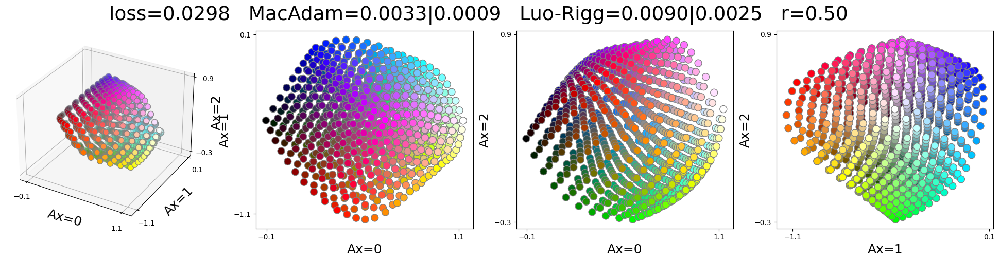

In [358]:
args = Arguments()
# args.nonlinearities = ['GELU', 'GELU', 'SELU', 'identity']
args.nonlinearities[-1] = 'identity'
# args.num_units = [13, 13]

block = 'block7'
layer_results = res_full_clip_B32[block]
exname = '%s_%s_%s' % (
    args.opt_method, '_'.join(str(i) for i in args.nonlinearities), 
    '_'.join(str(i) for i in args.num_units)
)
out_dir = '../analysis/uniform_colour_space/bg_128/%s/%s/%s_%s/' % ('clip', 'clip_B32', block, 'tmp')
os.makedirs(out_dir, exist_ok=True)
forward_model, fig, net_losses = optimise_instance(args, layer_results, out_dir)

#### PucsNets

The optimisation explained above might end up in an infinite number of spaces all reaching the
minimum loss function. Let us have a look at a few instances of PucsNets that we have trained and discuss the results.

We report the network training evolution with the following figure:
* The evolution of loss as a function of number of epochs.
* The prediction of human colour discrimination ellipses (i.e., MacAdam 1942 and Luo-Rigg 1986).
* The prediction of human colour difference (i.e., MacAdam 1974).
* Visualisation of all RGB points into the new network-space.

The instance below contains two hidden layers of each 8 units:
* The loss function although noisy steadily drops as we progress in the number of epochs. Note that the first peak at epoch 0 is because the first solution the network finds is to shrink the space range, but afterwards, it should satisfy the second constraint that brings the range of output to the range of 0 to 1.
* Network predicts human ellipses better than $\Delta E2000$ (compare solid to dashed lines: lower values indicate more uniform space). However, it is also important to note that the prediction power of the network does not change as a function of epochs, suggesting that the initial weights make a significant impact.
* Network predicts human colour differences data equally good as $Delta E2000$. It is important to note that PucsNet is only trained with pretrained colour discrimination thresholds, the fact that it obtains decent results in colour difference (a similar but different paradigm) suggests the newfound space is indeed capturing other aspects of human colour vision.

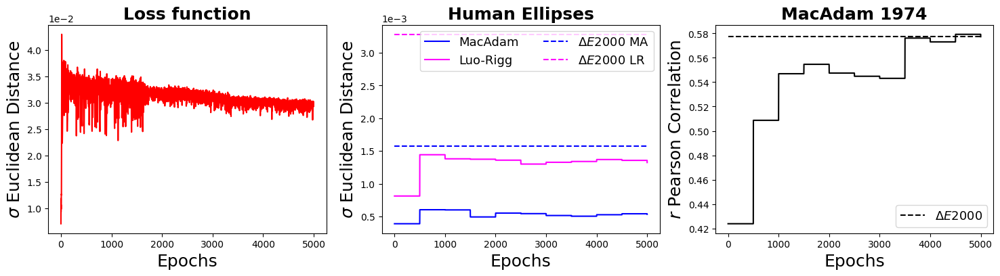

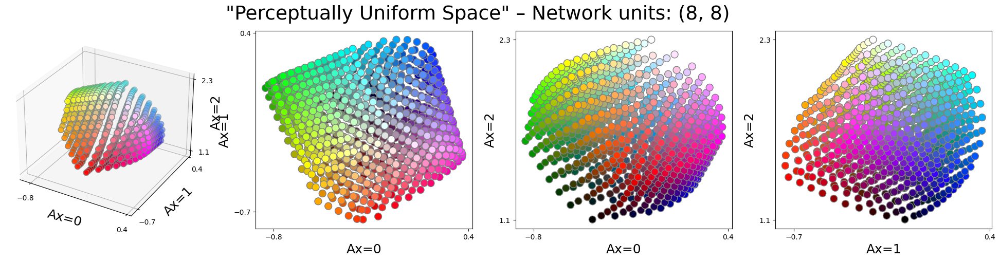

In [354]:
_, _ = plot_model_summary(
    '../analysis/uniform_colour_space/bg_128_new_2/clip/clip_B32/block7/Adamax_01_8_8/i002/'
)

The instance below contains two hidden layers of 8 and 9 units:
* Quantitatively the obtained results are very similar to the instance above.
* However, qualitatively the new space looks quite different from the instance above.

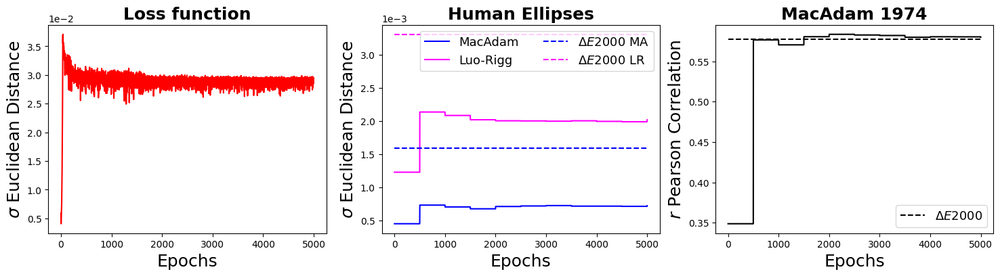

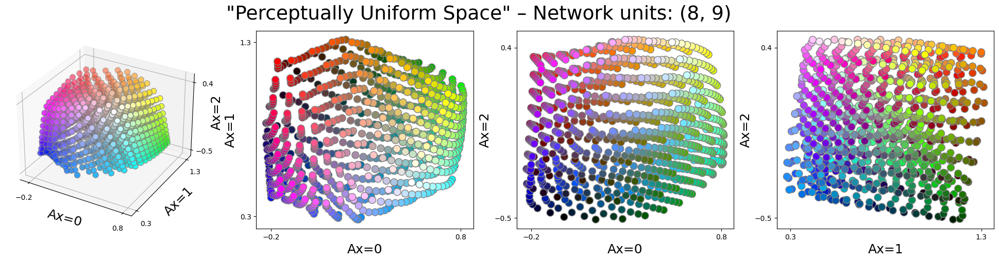

In [359]:
_, _ = plot_model_summary(
    '../analysis/uniform_colour_space/bg_128_new_2/clip/clip_B32/block7/Adam_02_8_9/i000/'
)

The instance below contains three hidden layers of 7, 14 and 9 units:
* Again we observe comparable quantitative results as above but with a different representation of colours.

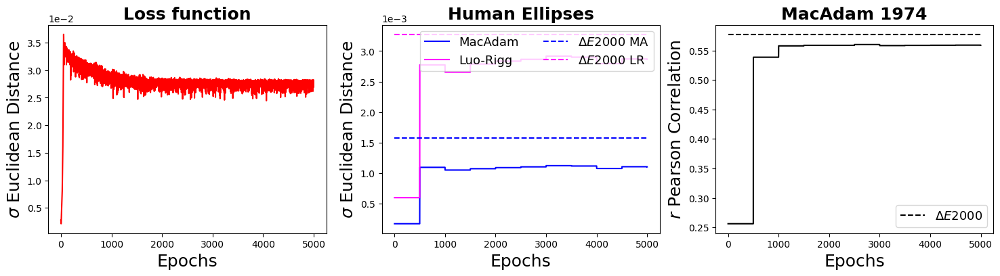

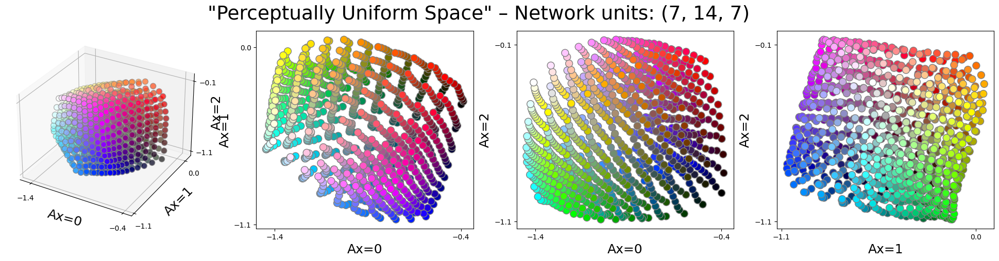

In [361]:
_, _ = plot_model_summary(
    '../analysis/uniform_colour_space/bg_128_new_2/clip/clip_B32/block7/Adamax_03_7_14_7/i001/'
)

**It is important to emphasise that no human data has been used in any part of network training**, therefore the fact that they predict human data equally or better than state-of-the-art $\Delta E2000$ suggests great potential in using pretrained networks to obtain a perceptually uniform colour space. We can further explore the flexibility of training these networks to create a perceptually uniform colour space under different conditions, such as illumination and background.

## Discussion
* Colour discrimination thresholds in pretrained networks highly resembles human sensitivity.
* Network architecture is influential: in comparison to convolution networks, **vision transformers** explain better human data.
* Artificial deep networks offer a **novel framework** to create a **perceptually uniform colour space**.

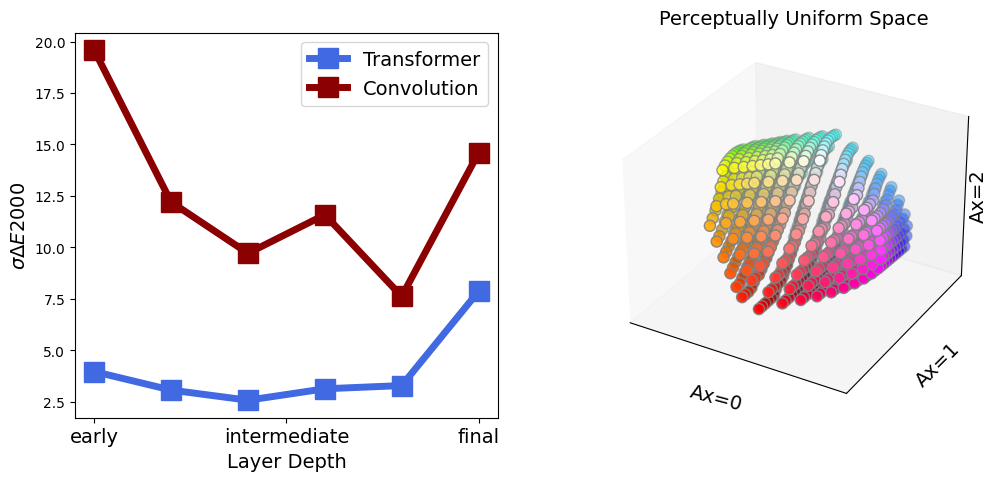

In [179]:
vit_vs_cnn = {
    'clip_B32': clip_B32_colour_diff,
    # 'vit_b_32': vit_b32_colour_diff,
    'clip_RN50': clip_RN50_colour_diff,
    # 'resnet50': resnet50_colour_diff,
}
for net_name, full_diffs in vit_vs_cnn.items():
    vit_vs_cnn[net_name] = [np.std(val['de2000']) for val in full_diffs.values()]
fig = plt.figure(figsize=(12, 5))
ax = fig.add_subplot(1, 2, 1)
ax.set_xlabel('Layer Depth', fontsize=14)
labels = ['early', 'intermediate', 'final']
ax.set_xticks([0, 2.5, 5], labels, fontsize=14)
ax.plot(vit_vs_cnn['clip_B32'], '-s', label='Transformer',
        color='royalblue', linewidth=5, markersize=15, alpha=1) 
ax.plot(vit_vs_cnn['clip_RN50'], '-s', label='Convolution',
        color='darkred', linewidth=5, markersize=15, alpha=1) 
ax.set_ylabel('$\sigma \Delta E2000$', fontsize=14)
ax.legend(fontsize=14, ncol=1)
ax = fig.add_subplot(1, 2, 2, projection='3d')
ax = scatter_3D(rgb_pts_pred, rgb_pts, ax, ['Ax=0', 'Ax=1', 'Ax=2'], labelpad=-15)
ax.set_title('Perceptually Uniform Space', fontsize=14)
plt.show()